In [1]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import interpn
import matplotlib as mpl
import matplotlib.image as mpimg
import matplotlib.patches as mpatches
import pandas as pd
import ctypes, assimulo, numpy as np
from assimulo.problem import Explicit_Problem
from assimulo.solvers import CVode #Imports the solver CVode from Assimulo
import time
import sys
import io
import cma
import os
import glob
import re
import itertools
from scipy.interpolate import interp1d, LinearNDInterpolator
from scipy.ndimage import uniform_filter1d
from scipy.signal import argrelextrema, find_peaks
import functions_to_import_CoA as f_CoA
from setuptools import Extension, setup
from Cython.Build import cythonize
import importlib
import solver.model
importlib.reload(solver.model)
importlib.reload(solver.model.cwrapping)
from scipy.fft import fft, fftfreq
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
#clang -shared -o path/libModel_Arts_Audebert_Shi.so path/FULL_MODEL_Arts_Audebert_Shi.c -arch x86_64    --->    run in terminal

In [2]:
def interpolation(label,variables,matrix,list_name,list_name_3d,v_ist,v_LV,v_da):
    for i, (label_t, variable) in enumerate(zip(label, variables)):
        # Create a grid of points for interpolation
        grid_points = (v_ist, v_LV, v_da)
        values = matrix[i]

        # Interpolate using interpn
        v_ist_interpolate = np.linspace(np.max(v_ist), np.min(v_ist), (len(v_ist)-1)*20+1)
        v_LV_interpolate = np.linspace(np.max(v_LV), np.min(v_LV), 251)
        v_da_interpolate = np.linspace(np.min(v_da), np.max(v_da), 251)
        xi, yi, zi = np.meshgrid(v_ist_interpolate,
                                 v_LV_interpolate,
                                 v_da_interpolate,
                                 indexing='ij')
        interp_values = interpn(grid_points, values, np.array([xi.flatten(), yi.flatten(), zi.flatten()]).T)
        interp_values_3d = interp_values.reshape(xi.shape)
        list_name.append(interp_values)
        list_name_3d.append(interp_values_3d)
    return list_name, list_name_3d, xi, yi, zi, v_ist_interpolate, v_LV_interpolate, v_da_interpolate

def interpolation2D(label,variables,matrix,list_name,v_LV,v_da):
    for i, (label_t, variable) in enumerate(zip(label, variables)):
        values = matrix[i]
        v_LV_interpolate = np.linspace(1, 0.2, 251)
        v_da_interpolate = np.linspace(0.8, 1.7, 251)
        X, Y = np.meshgrid(v_da_interpolate,v_LV_interpolate)
        interp = LinearNDInterpolator(list(zip(v_da,v_LV)), values)
        interp_values_2d = interp(X, Y)
        list_name.append(interp_values_2d)
    return list_name, v_LV_interpolate, v_da_interpolate

In [16]:
v_ist = [1,0.9,0.8,0.7,0.6,0.5,0.4,0.3,0.2] 
v_LV = [1,0.9,0.8,0.7,0.6,0.5,0.4,0.35] 
v_SVratio = [0.97,0.78,0.66,0.523,0.403,0.297,0.205] 
v_da = [0.8,0.9,1,1.1,1.2,1.3,1.4,1.5,1.6,1.7] 

GA = 32
Tc = 0.43
density = 1.05
viscosity = (1.15+0.075*GA)/100

variables_V = [('AO1_RC', 'Qo'), ('AO2_RCL', 'Qo'), ('Bif_BRR1in_BRL2in_BRout', 'Qo'), ('Bif_UBR1in_UBL2in_UBout', 'Qo'), ('SVC_RCL', 'Qo'), ('Bif_AOin_AO1out_INTE2out_HE3out_KID4out', 'Qo3'), ('Bif_AOin_AO1out_INTE2out_HE3out_KID4out', 'Qo4'), ('Bif_AOin_LEG1out_UA2out', 'Qo2'), ('IVC_RCL', 'Qo'), ('Bif_PAin_LUNG1out_DA2out', 'Qo1')]
variables_P = [('LUNG_RCL', 'Pi'), ('LA', 'Pi'), ('RA', 'Pi'), ('LV', 'Pi'), ('RV', 'Pi'), ('Bif_PAin_LUNG1out_DA2out', 'Pi'), ('Bif_AAin_AAA1out_BrachT2out', 'Pi'), ('Bif_DA1in_AI2in_AOout', 'Pi2'), ('Bif_DA1in_AI2in_AOout', 'Pi1'), ('Bif_AOin_AO1out_INTE2out_HE3out_KID4out', 'Pi'), ('Bif_AOin_LEG1out_UA2out', 'Pi'), ('Bif_BR1in_UB2in_SVCout', 'Pi1'), ('Bif_BR1in_UB2in_SVCout', 'Pi2'), ('Bif_SVC1in_IVC2in_RAout', 'Pi1'), ('HE_RC', 'Pi'), ('Bif_KID1in_UV2in_HE3in_LEG4in_IVCout', 'Pi3'), ('Bif_AOin_AO1out_INTE2out_HE3out_KID4out', 'Pi'), ('Bif_KID1in_UV2in_HE3in_LEG4in_IVCout', 'Pi1'), ('PLAC_RC', 'Pi'), ('Bif_UVin_DV1out_HE2out', 'Pi'), ('Bif_IVCin_FO1out_RA2out', 'Pi'), ('Bif_BRR1in_BRL2in_BRout', 'Pi')]
variables_W = [('Bif_PAin_LUNG1out_DA2out', 'Qo2'), ('PA_RCL', 'Qo'), ('AA_RCL', 'Qo'), ('AO1_RC', 'Qo'), ('AO2_RCL', 'Qo'), ('Bif_BRR1in_BRL2in_BRout', 'Qo'), ('Bif_UBR1in_UBL2in_UBout', 'Qo'), ('SVC_RCL', 'Qo'), ('Bif_AOin_LEG1out_UA2out', 'Qo2'), ('UV_RCL', 'Qo'), ('IVC_RCL', 'Qo')]
variables_R = [('Parameters', 'Rda'), ('Parameters', 'Rpa'), ('Parameters', 'Raa')]
label = ['lungs', 'left atrium', 'right atrium', 'left ventricle', 'right ventricle', 'main pulmonary artery', 'ascending aorta', 'aortic isthmus', 'ductus arteriosus', 'thoracic aorta', 'abdominal aorta', 'jugular vein', 'subclavian vein', 'superior vena cava', 'hepatic artery', 'hepatic vein', 'renal artery', 'renal vein', 'umbilical artery', 'umbilical vein', 'inferior vena cava', 'middle cerebral artery']
label_v = ['thoracic aorta', 'abdominal aorta', 'middle cerebral artery', 'subclavian vein', 'superior vena cava', 'hepatic artery', 'renal artery', 'umbilical artery', 'inferior vena cava', 'lungs']
label_2 = ['ductus arteriosus', 'main pulmonary artery', 'ascending aorta', 'thoracic aorta', 'Abdominal aorta', 'jugular vein', 'subclavian vein', 'superior vena cava', 'umbilical artery', 'umbilical vein', 'inferior vena cava']
radius = [0.2090,0.3415,0.2984690662736599,0.25955,0.22,0.18755,0.17366,0.2,0.165915,0.345,0.227]


healthy_values_V = np.zeros(len(label))
healthy_values_P = np.zeros(len(label))
healthy_values_W = np.zeros(len(label_2))
healthy_values_R = np.zeros(len(variables_R))

data = np.load(f"Results_cluster_final5/IST100_LV100_DA100.npz")
t = data['voi']  
results = data['data']  
names = data['names']
constants = data['constants']
names_constants = data['names_constants']

for i in range(len(variables_V)):
    healthy_values_V[i] = np.trapz(results[:,np.where(np.all(names == variables_V[i], axis=1))[0][0]],t)/2
    if label_v[i] == 'middle cerebral artery':
        Q_LICA = results[:,np.where(np.all(names == ('ICaroAL_RCL', 'Qo'), axis=1))[0][0]]
        Q_RICA = results[:,np.where(np.all(names == ('ICaroAR_RCL', 'Qo'), axis=1))[0][0]]
        Q_MCA = (Q_LICA + Q_RICA)*0.75*0.74312
        healthy_values_V[i] = np.trapz(Q_MCA,t)/2
    
for i in range(len(variables_P)):
    if label[i] == 'middle cerebral artery':
        P_LICA = results[:,np.where(np.all(names == ('Bif_BRR1in_BRL2in_BRout', 'Pi2'), axis=1))[0][0]]
        P_RICA = results[:,np.where(np.all(names == ('Bif_BRR1in_BRL2in_BRout', 'Pi1'), axis=1))[0][0]]
        healthy_values_P[i] = (np.max(P_LICA)+np.max(P_RICA))/2 
    else: 
        healthy_values_P[i] = np.max(results[:,np.where(np.all(names == variables_P[i], axis=1))[0][0]])

for i in range(len(variables_W)):
    healthy_values_W[i] = np.max(4*viscosity*results[:,np.where(np.all(names == variables_W[i], axis=1))[0][0]]/(np.pi*radius[i]**3))/1333

for i in range(len(variables_R)):
    healthy_values_R[i] = constants[np.where(np.all(names_constants == variables_R[i], axis=1))[0][0]]
    
Rda = constants[np.where(np.all(names_constants == ('Parameters','Rda'), axis=1))[0][0]]  
Vwall_lv = constants[np.where(np.all(names_constants == ('Parameters','Vwall_lv'), axis=1))[0][0]] 

matrix_V = np.zeros((len(label_v),len(v_ist),len(v_LV),len(v_da)))
matrix_P = np.zeros((len(label),len(v_ist),len(v_LV),len(v_da)))
matrix_W = np.zeros((len(label_2),len(v_ist),len(v_LV),len(v_da)))
print((np.max(results[:,np.where(np.all(names == ('LV','Vcav'), axis=1))[0][0]])/np.max(results[:,np.where(np.all(names == ('RV','Vcav'), axis=1))[0][0]])))

INTERPOLATION_P = []
INTERPOLATION_V = []
INTERPOLATION_W = []

for i_ist, degree_ist in enumerate(v_ist): 
    v_LV_all = []
    v_da_all = []
    list_V = [[] for _ in range(len(label_v))]
    list_P = [[] for _ in range(len(label))]
    list_W = [[] for _ in range(len(label_2))]
    
    INTERPOLATION_P_ist = []
    INTERPOLATION_V_ist = []
    INTERPOLATION_W_ist = []
    
    # Use glob to get the list of files matching the pattern
    file_pattern = f"Results_cluster_final5/IST{int(degree_ist*100)}_*.npz"
    file_list = glob.glob(file_pattern)
    print(len(file_list))

    for file_path in file_list:
        data = np.load(file_path)
    
    #for i_LV, degree_LV in enumerate(v_LV):
    #    for i_da, degree_da in enumerate(v_da):
            #data = np.load(f"Results_cluster_best/IST{int(degree_ist*100)}_LV{int(degree_LV*100)}_DA{int(degree_da*100)}.npz")
        t = data['voi']  
        results = data['data']  
        names = data['names'] 
        constants = data['constants']
        names_constants = data['names_constants']

        for i in range(len(variables_V)):
            #matrix_V[i][i_ist][i_LV][i_da] = np.trapz(results[:,np.where(np.all(names == variables_V[i], axis=1))[0][0]],t)/2
            if label_v[i] == 'middle cerebral artery':
                Q_LICA = results[:,np.where(np.all(names == ('ICaroAL_RCL', 'Qo'), axis=1))[0][0]]
                Q_RICA = results[:,np.where(np.all(names == ('ICaroAR_RCL', 'Qo'), axis=1))[0][0]]
                Q_MCA = (Q_LICA + Q_RICA)*0.75*0.74312
                list_V[i].append(np.trapz(Q_MCA,t)/2)
            else:
                list_V[i].append(np.trapz(results[:,np.where(np.all(names == variables_V[i], axis=1))[0][0]],t)/2)
            
        for i in range(len(variables_P)):
            #matrix_P[i][i_ist][i_LV][i_da] = np.max(results[:,np.where(np.all(names == variables_P[i], axis=1))[0][0]])
            if label[i] == 'middle cerebral artery':
                P_LICA = results[:,np.where(np.all(names == ('Bif_BRR1in_BRL2in_BRout', 'Pi2'), axis=1))[0][0]]
                P_RICA = results[:,np.where(np.all(names == ('Bif_BRR1in_BRL2in_BRout', 'Pi1'), axis=1))[0][0]]
                list_P[i].append((np.max(P_LICA)+np.max(P_RICA))/2)   
            else: 
                list_P[i].append(np.max(results[:,np.where(np.all(names == variables_P[i], axis=1))[0][0]]))
            
        for i in range(len(variables_W)):
            rad = radius[i]
            if i == 0 or i == 1 or i == 2:
                degree = (healthy_values_R[i]/constants[np.where(np.all(names_constants == variables_R[i], axis=1))[0][0]])**(1/4)
                rad = radius[i]*degree
            if label_2[i] == 'ascending aorta' and degree_ist == 1 and int(re.search(r'LV(\d+)_', file_path).group(1))/100 == 1 and int(re.search(r'DA(\d+).', file_path).group(1))/100 == 1:
                print(f"Raa = {constants[np.where(np.all(names_constants == variables_R[2], axis=1))[0][0]]}")
                print(f"Raa healthy = {healthy_values_R[2]}")
                print(f"degree = {degree}")
                print(f"rad = {rad}")
                print(f"Qmax = {np.max(results[:,np.where(np.all(names == variables_W[i], axis=1))[0][0]])}")
                print(f"Qtotal = {np.trapz(results[:,np.where(np.all(names == ('AA_RCL', 'Qo'), axis=1))[0][0]],t)/2}")
                print(f"wss = {np.max(4*viscosity*results[:,np.where(np.all(names == variables_W[i], axis=1))[0][0]]/(np.pi*rad**3))/1333}")
            if label_2[i] == 'ascending aorta' and degree_ist == 0.2 and int(re.search(r'LV(\d+)_', file_path).group(1))/100 == 1 and int(re.search(r'DA(\d+).', file_path).group(1))/100 == 1:
                print(f"Raa = {constants[np.where(np.all(names_constants == variables_R[2], axis=1))[0][0]]}")
                print(f"Raa healthy = {healthy_values_R[2]}")
                print(f"degree = {degree}")
                print(f"rad = {rad}")
                print(f"Qmax = {np.max(results[:,np.where(np.all(names == variables_W[i], axis=1))[0][0]])}")
                print(f"Qtotal = {np.trapz(results[:,np.where(np.all(names == ('AA_RCL', 'Qo'), axis=1))[0][0]],t)/2}")
                print(f"wss = {np.max(4*viscosity*results[:,np.where(np.all(names == variables_W[i], axis=1))[0][0]]/(np.pi*rad**3))/1333}")
  
            #matrix_W[i][i_ist][i_LV][i_da] = np.max(4*viscosity*results[:,np.where(np.all(names == variables_W[i], axis=1))[0][0]]/(np.pi*rad**3))/1333
            list_W[i].append(np.max(4*viscosity*results[:,np.where(np.all(names == variables_W[i], axis=1))[0][0]]/(np.pi*rad**3))/1333)

        #print(round((np.max(results[:,np.where(np.all(names == ('LV','Vcav'), axis=1))[0][0]])/np.max(results[:,np.where(np.all(names == ('RV','Vcav'), axis=1))[0][0]])),2))
        v_LV_all.append(np.max(results[:,np.where(np.all(names == ('LV','Vcav'), axis=1))[0][0]])/np.max(results[:,np.where(np.all(names == ('RV','Vcav'), axis=1))[0][0]]))
        #(int(re.search(r'LV(\d+)_', file_path).group(1))/100) # 
        #np.trapz(results[:,np.where(np.all(names == ('LV','Vcav'), axis=1))[0][0]],t)/np.trapz(results[:,np.where(np.all(names == ('RV','Vcav'), axis=1))[0][0]],t)
        v_da_all.append(round((Rda/constants[np.where(np.all(names_constants == ('Parameters','Rda'), axis=1))[0][0]])**(1/4),2)) #(round(constants[np.where(np.all(names_constants == ('Parameters','Vwall_lv'), axis=1))[0][0]]/Vwall_lv,2)) #
        #print(round((0.03888377/constants[np.where(np.all(names_constants == ('Parameters','Rda'), axis=1))[0][0]])**(1/4),2))
        
           
    # Interpolation
    INTERPOLATION_P_ist, v_LV_interpolate, v_da_interpolate = interpolation2D(label,variables_P,list_P,INTERPOLATION_P_ist,v_LV_all,v_da_all)
    INTERPOLATION_V_ist, v_LV_interpolate, v_da_interpolate = interpolation2D(label_v,variables_V,list_V,INTERPOLATION_V_ist,v_LV_all,v_da_all)
    INTERPOLATION_W_ist, v_LV_interpolate, v_da_interpolate = interpolation2D(label_2,variables_W,list_W,INTERPOLATION_W_ist,v_LV_all,v_da_all)
    
    INTERPOLATION_P.append(INTERPOLATION_P_ist)
    INTERPOLATION_V.append(INTERPOLATION_V_ist)
    INTERPOLATION_W.append(INTERPOLATION_W_ist)

    print(np.shape(INTERPOLATION_P_ist))

#np.savez('Results_matrix2D_V.npz', v_LV_interpolate = v_LV_interpolate, v_da_interpolate = v_da_interpolate, INTERPOLATION_P = np.transpose(INTERPOLATION_P, (1, 0, 2, 3)), INTERPOLATION_V = np.transpose(INTERPOLATION_V, (1, 0, 2, 3)), INTERPOLATION_W = np.transpose(INTERPOLATION_W, (1, 0, 2, 3)), label = label, label_v = label_v, label_2 = label_2, healthy_values_V = healthy_values_V, healthy_values_P = healthy_values_P, healthy_values_W = healthy_values_W, v_ist = v_ist, v_LV = v_LV, v_SVratio = v_SVratio, v_da = v_da)


0.9465361
65
Raa = 0.01028363914594297
Raa healthy = 0.01028363914594297
degree = 1.0
rad = 0.2984690662736599
Qmax = 18.312007904052734
Qtotal = 2.237574815750122
wss = 0.023353196048951204
(22, 251, 251)
65
(22, 251, 251)
65
(22, 251, 251)
64
(22, 251, 251)
64
(22, 251, 251)
64
(22, 251, 251)
64
(22, 251, 251)
64
(22, 251, 251)
64
Raa = 0.01028363914594297
Raa healthy = 0.01028363914594297
degree = 1.0
rad = 0.2984690662736599
Qmax = 9.325398445129395
Qtotal = 1.8531979322433472
wss = 0.011892624931593005
(22, 251, 251)


In [2]:
# Import interpolated data from Results_matrix.npz
data = np.load(f"Results_matrix2D_V.npz")
healthy_values_V = data['healthy_values_V'] 
healthy_values_P = data['healthy_values_P'] 
healthy_values_W = data['healthy_values_W'] 
v_LV_interpolate = data['v_LV_interpolate']
v_da_interpolate = data['v_da_interpolate']
INTERPOLATION_V = data['INTERPOLATION_V'] 
INTERPOLATION_P = data['INTERPOLATION_P'] 
INTERPOLATION_W = data['INTERPOLATION_W']
v_ist = data['v_ist'] 
v_LV = data['v_LV'] 
v_da = data['v_da']
label = data['label']
label_v = data['label_v']
label_2 = data['label_2']
v_SVratio = data['v_SVratio']


In [3]:
def create_2Dplot_contour(label, interpolation, healthy_values, title, v_ist, v_LV, v_da, v_LV_interpolate, v_da_interpolate, c_pos, c_neg, list_variation, list_matrix, reference_label, reference_value, reference_ist):
    v_LV_positions = [np.argmin(np.abs(v_LV_interpolate - value)) for value in v_LV]
    v_da_positions = [np.argmin(np.abs(v_da_interpolate - value)) for value in v_da]

    fig, axes = plt.subplots(1, len(v_ist), figsize=(24, 3), sharey=True)
    list_matrix2 = []
    list_variation2 = []

    for i in range(len(v_ist)):
        ax = axes[i]

        v_ist_value = v_ist[i]
        interpolation_100 = interpolation/healthy_values*100-100
        matrix = interpolation_100[i]
        list_variation2.append(matrix)
        
        ax.imshow(matrix, cmap='turbo', origin='lower', vmin=-15, vmax=15, alpha = 1)
        CS = ax.contour(np.linspace(0,len(v_da_interpolate),len(v_da_interpolate)),np.linspace(0,len(v_LV_interpolate),len(v_LV_interpolate)), matrix, levels=[-15, -10, -5, 0, 5, 10, 15], colors = ('w','k','k','k','k','k','w')) #cmap='turbo', origin='lower', vmin=90, vmax=110
        
        # Write values in contours
        closest_coordinates = []
        for line in CS.collections:
            if line.get_paths():
                x_value = line.get_paths()[0].get_extents().get_points().mean(axis=0)[0]
                coordinates_list = line.get_paths()[0].vertices
                index_closest_x = np.argmin(np.abs(coordinates_list[:, 0] - x_value))
                closest_coordinates.append(tuple(coordinates_list[index_closest_x]))
        if title != 'Wall shear stress' or label != 'Ascending aorta' or i != 8: 
            ax.clabel(CS, inline=True, fontsize=10, manual=closest_coordinates)

        #if v_ist_value == 0.4:
        #    lv_124 = np.argmin(np.abs(v_LV_interpolate - 0.23363686669774159))
        #    da_124 = np.argmin(np.abs(v_da_interpolate - 1.5))
            
        #    print(f"{title} at {label}: {matrix[lv_124,da_124]}")
        #    print(interpolation[i][lv_124,da_124])            
        
        # Put x,y labels
        ax.set_yticks(v_LV_positions, np.round(np.asarray(v_LV)*100).astype(int))
        ax.set_xticks(v_da_positions, np.round(v_da*100).astype(int))
        ax.set_ylim([min(v_LV_positions),max(v_LV_positions)])
        ax.set_xlabel('DA Degree')
        ax.set_ylabel('EDV Ratio')
        ax.set_title(f'IST = {int(v_ist[i]*100)}%')
        
        # Convert matrix to colors
        matrix_2 = np.ones(np.shape(matrix))*100 
        matrix_2[matrix>=15] = c_pos
        matrix_2[matrix<=-15] = c_neg
        #matrix_2[(matrix > -10) & (matrix < 10)] = 0
        matrix_2[(matrix > -15) & (matrix < 15)] = 2
        matrix_2[(matrix >= -10) & (matrix <= 10)] = 1
        matrix_2[(matrix >= -5) & (matrix <= 5)] = 0
    
        list_matrix2.append(matrix_2)
        if any(matrix[matrix>=15]):
            reference_label.append(f'{title} at {label} > 115%')
            reference_value.append(c_pos)
            reference_ist.append(v_ist[i])
        if any(matrix[matrix<=-15]):
            reference_label.append(f'{title} at {label} < 85%')
            reference_value.append(c_neg)
            reference_ist.append(v_ist[i])            

    # Show the plot
    fig.suptitle(f'{title} at {label}', fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()
        
    list_matrix.append(list_matrix2)
    list_variation.append(list_variation2)
    
    return list_variation, list_matrix, reference_label, reference_value, reference_ist, c_pos, c_neg

In [4]:
#c_p = [2,1,2,1,2,2,1,1,1,1,1,3,3,3,4,4,4,4,4,4,4]
#c_w = [1,2,1,1,1,3,3,3,4,4,4] 
#c_v = [1,1,3,3,3,4,4,4,4,1]

c_p = [4,3,4,3,4,4,3,3,3,3,3,5,5,5,6,6,6,6,6,6,6,5]
c_w = [3,4,3,3,3,5,5,5,6,6,6] 
c_v = [3,3,5,5,5,6,6,6,6,3]

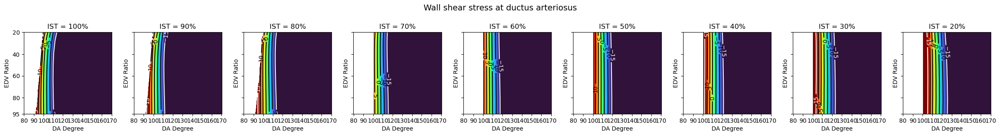

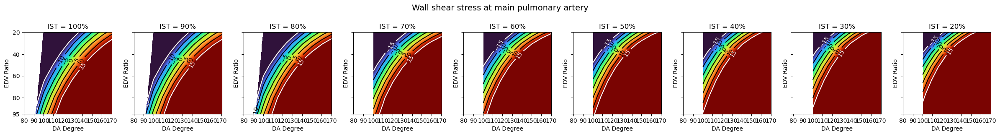

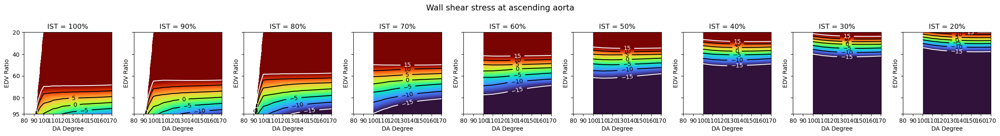

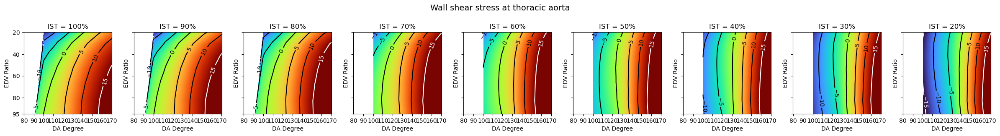

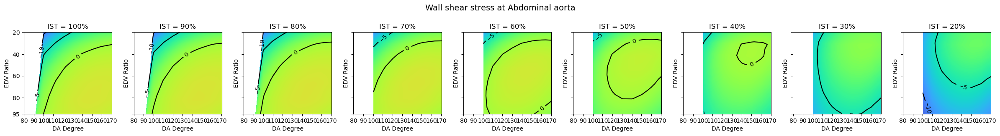

...

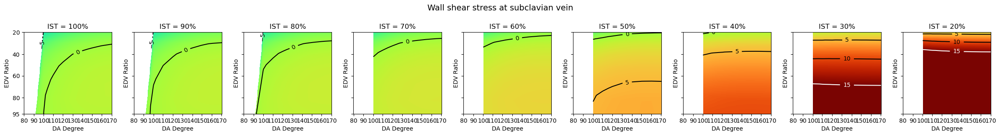

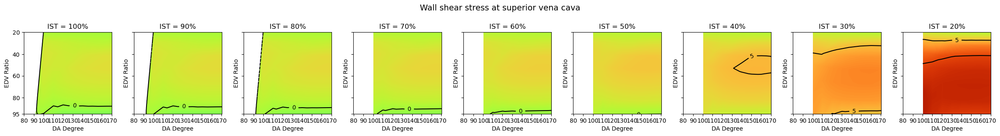

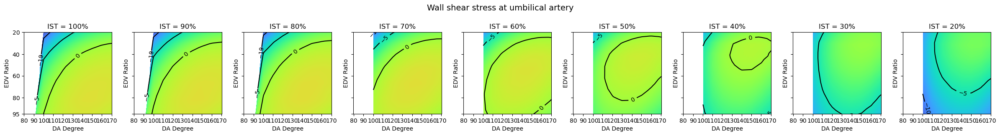

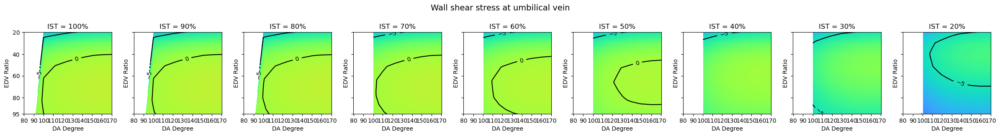

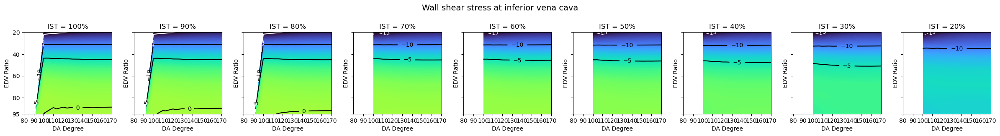

In [5]:
reference_label = []
reference_value = []
reference_ist = []
list_matrix = []
list_variation = []
v_SV = [0.2,0.4,0.6,0.8,0.95]
#np.asarray([1,1.1,1.2,1.3,1.4])
for i in range(len(INTERPOLATION_W)):
    c_pos = c_w[i]
    c_neg = c_w[i]
    list_variation, list_matrix, reference_label, reference_value, reference_ist, c_pos, c_neg = create_2Dplot_contour(label_2[i], INTERPOLATION_W[i], healthy_values_W[i], 'Wall shear stress', v_ist, v_SV, v_da, v_LV_interpolate, v_da_interpolate, c_pos, c_neg, list_variation, list_matrix, reference_label, reference_value, reference_ist)


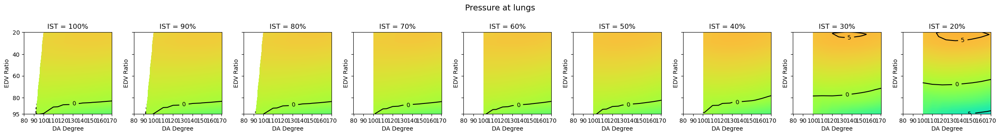

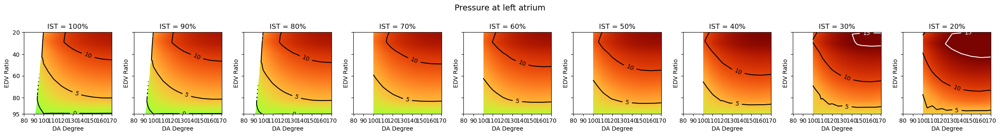

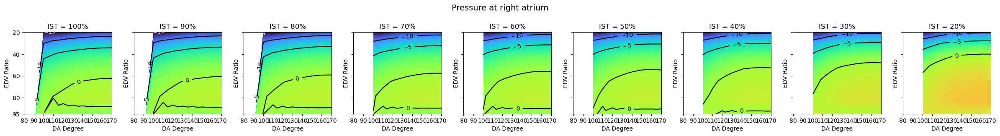

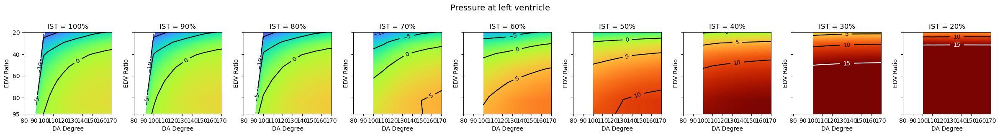

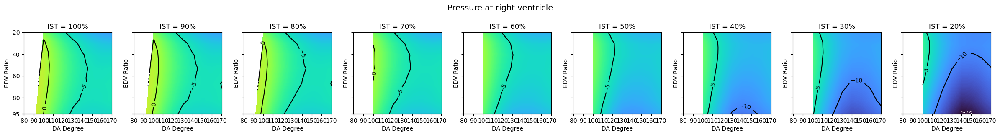

...

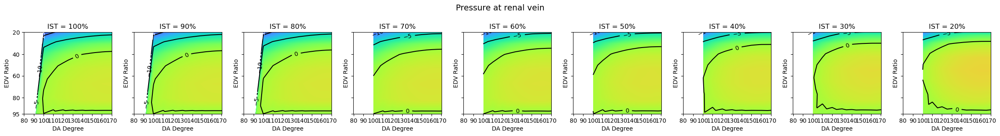

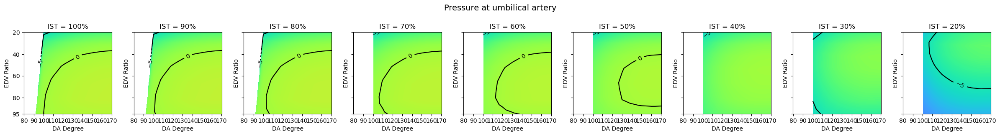

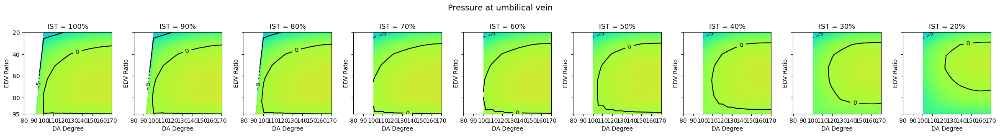

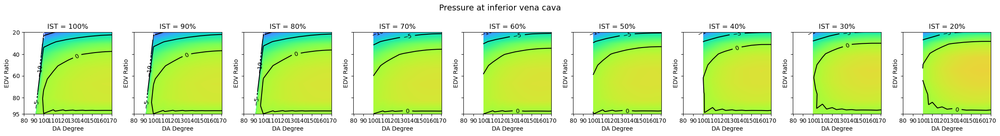

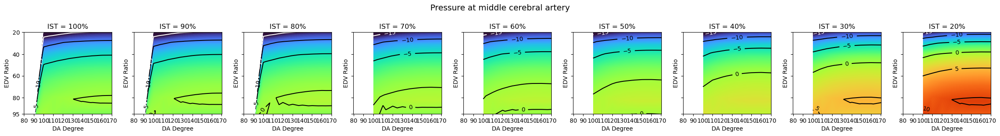

In [6]:
for i in range(len(INTERPOLATION_P)):
    c_pos = c_p[i]
    c_neg = c_p[i]
    list_variation,list_matrix, reference_label, reference_value, reference_ist, c_pos, c_neg = create_2Dplot_contour(label[i], INTERPOLATION_P[i], healthy_values_P[i], 'Pressure', v_ist, v_SV, v_da, v_LV_interpolate, v_da_interpolate, c_pos, c_neg, list_variation, list_matrix, reference_label, reference_value, reference_ist)


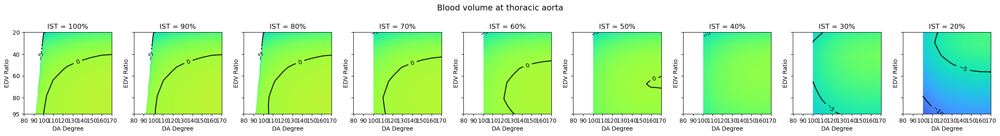

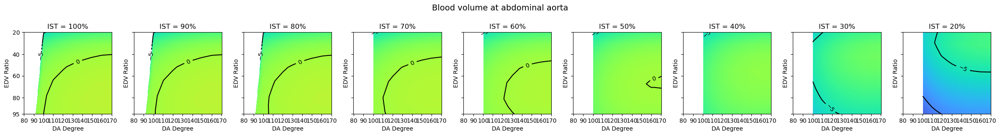

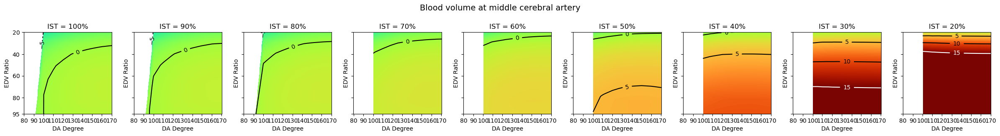

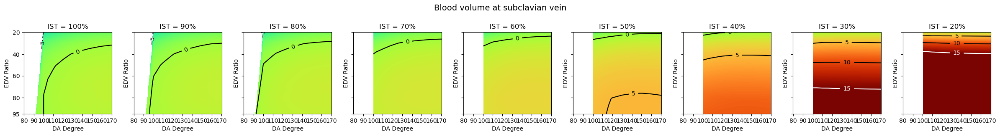

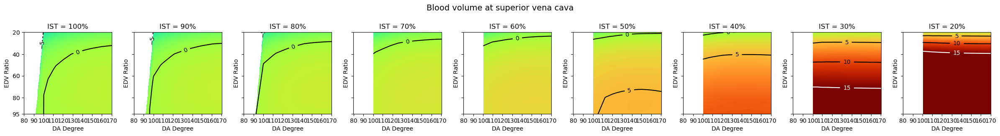

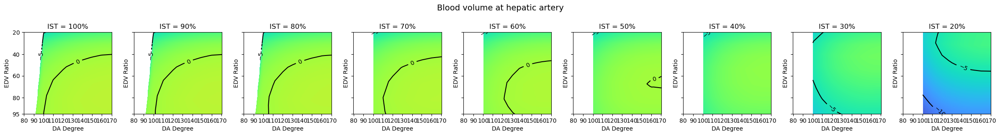

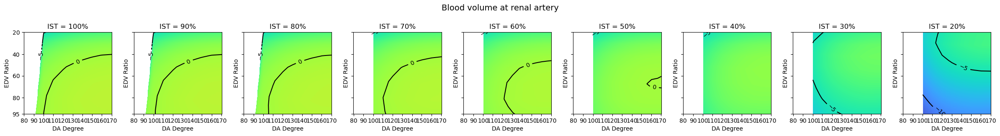

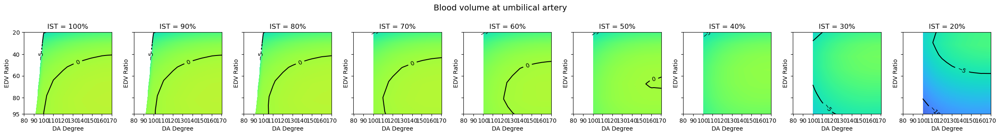

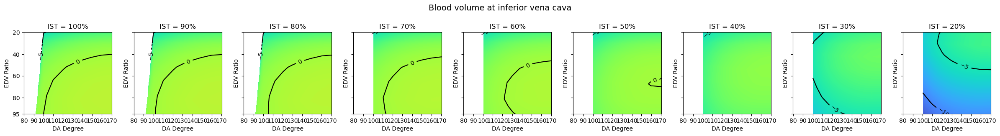

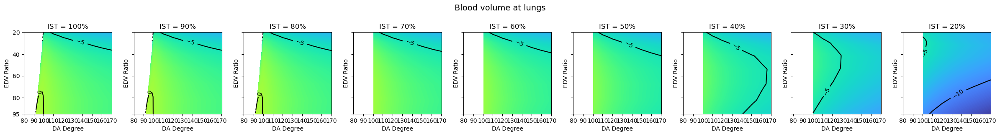

In [7]:
for i in range(len(INTERPOLATION_V)):
    c_pos = c_v[i]
    c_neg = c_v[i]
    list_variation,list_matrix, reference_label, reference_value, reference_ist, c_pos, c_neg = create_2Dplot_contour(label_v[i], INTERPOLATION_V[i], healthy_values_V[i], 'Blood volume', v_ist, v_SV, v_da, v_LV_interpolate, v_da_interpolate, c_pos, c_neg, list_variation, list_matrix, reference_label, reference_value, reference_ist)


In [8]:
# Combine and sort the lists based on reference_value
reference_value.append(0)
reference_value.append(1)
reference_value.append(2)
reference_label.append('Physiological 15') # 15
reference_label.append('Physiological 10')
reference_label.append('Physiological 5')
sorted_data = sorted(zip(reference_value, reference_label))

# Keep only unique values
unique_sorted_data = []
seen_values = set()

for value, i_label in sorted_data:
    if value not in seen_values:
        seen_values.add(value)
        unique_sorted_data.append((value, i_label))

# Separate the sorted and unique lists back into separate lists
sorted_reference_value, sorted_reference_label = zip(*unique_sorted_data)

# Print the results
print("Sorted and Unique Reference Values:", sorted_reference_value)
print("Sorted and Unique Reference Labels:", sorted_reference_label)

sorted_reference_label = ['Physiological 5','Physiological 10','Physiological 15','Left heart, aorta and ductus arteriosus','Right heart, main pulmonary artery and lungs',
                          'Head and upper body','Placenta, kidneys and liver',''] #'Physiological 5','Physiological 10','Physiological 15',

Sorted and Unique Reference Values: (0, 1, 2, 3, 4, 5, 6)
Sorted and Unique Reference Labels: ('Physiological 15', 'Physiological 10', 'Physiological 5', 'Pressure at ascending aorta > 115%', 'Pressure at right atrium < 85%', 'Blood volume at middle cerebral artery > 115%', 'Pressure at hepatic vein < 85%')


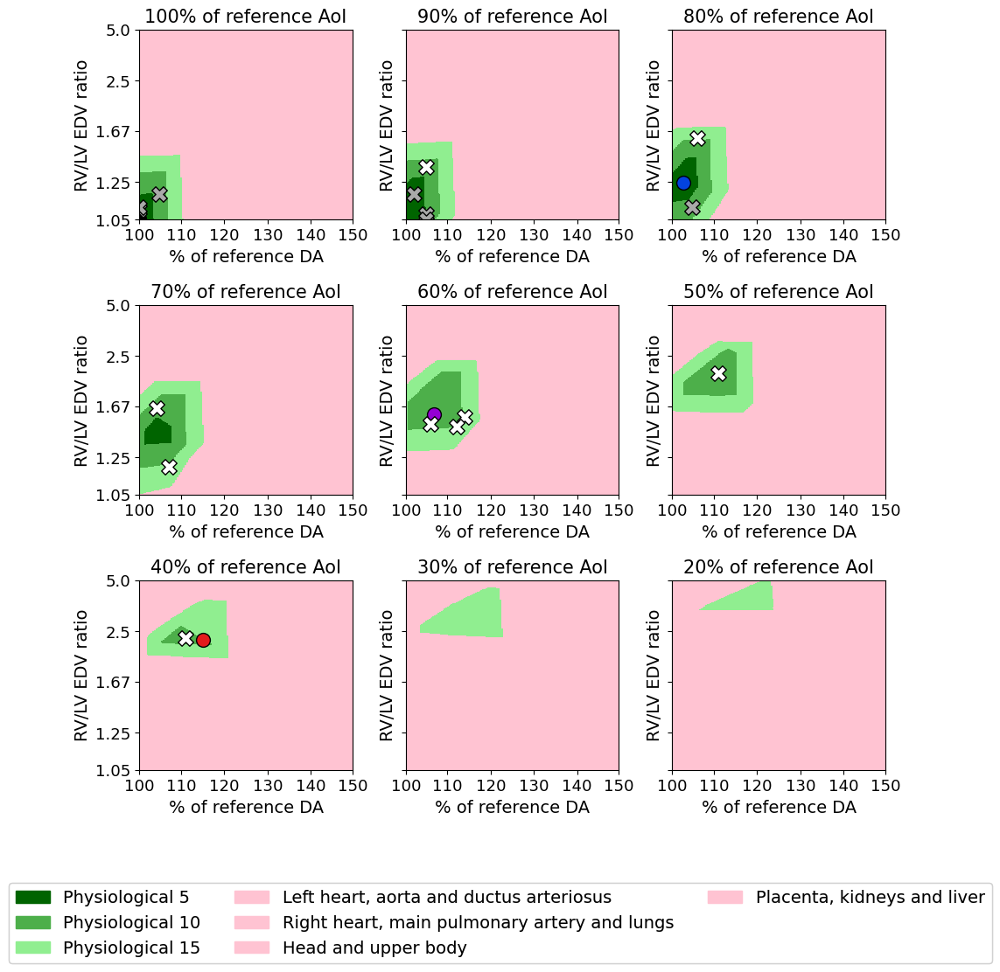

In [ ]:
# Physiological regions

possible_colors = ['darkgreen', '#4daf4a', 'lightgreen', '#ffc3d2', '#ffc3d2', '#ffc3d2', '#ffc3d2', 'w'] #['darkgreen', '#4daf4a', 'lightgreen', '#ff7f00', '#f781bf', '#17BECF', '#F0E442', 'w']
v_ist_plot = [1,0.9,0.8,0.7,0.6,0.5,0.4,0.3,0.2]

fig, axes = plt.subplots(3, 3, figsize=(11, 11), sharey=True)
axes = axes.flatten()

transposed_variation = [list(zip(*sublist)) for sublist in zip(*list_variation)]
transposed_matrix = [list(zip(*sublist)) for sublist in zip(*list_matrix)]
v_LV_positions = [np.argmin(np.abs(v_LV_interpolate - value)) for value in [0.95,0.8,0.6,0.4,0.2]]
v_da_positions = [np.argmin(np.abs(v_da_interpolate - value)) for value in np.linspace(1,1.5,6)]

cmap = mpl.colors.ListedColormap(possible_colors)
bounds = [-1, 0.9, 1.9, 2.9, 3.9, 4.9, 5.9, 6.9, 7.9] #bounds = [-1, 0.9, 1.9, 2.9, 3.9, 4.9, 5.9] 
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

ist_centroid = [1]
lv_centroid = [1]
edv_centroid = [0.945]
da_centroid = [1]
ist_curve = []
lv_curve = []
edv_curve = []
da_curve = []
ALL_COLOR_TOTAL = []

v_lv_interpolate = np.linspace(1, 0.35, 251)
v_colors = ['black', 'black', '#0343DF', 'darkviolet', '#e41a1c','k']

for i in range(len(v_ist_plot)):
    matrix = transposed_matrix[i] #i*2
    variation = transposed_variation[i] #i*2
    ax = axes[i]
    matrix2 = [list(zip(*sublist)) for sublist in zip(*matrix)]
    matrix2_array = np.array(matrix2)
    COLOR_TOTAL = np.transpose(np.maximum.reduce(matrix2_array))
    ALL_COLOR_TOTAL.append(COLOR_TOTAL)
    
    if i == 0 or i == 2 or i == 4 or i == 6:

        PHYSIOLOGIC = np.where((COLOR_TOTAL == 0) | (COLOR_TOTAL == 1), 1, 0)
        row_indices, col_indices = np.where(PHYSIOLOGIC == 1)
        centroid_row = np.mean(row_indices)
        centroid_col = np.mean(col_indices)

        variation2 = [list(zip(*sublist)) for sublist in zip(*variation)]
        variation2_array = np.array(variation2)
        VARIATION_TOTAL = np.transpose(np.sum(abs(variation2_array),0))
        PHYSIOLOGIC_VARIATION = VARIATION_TOTAL[row_indices, col_indices]

        if np.sum(PHYSIOLOGIC) > 0:
            ist_centroid.append(v_ist_plot[i])
            lv_centroid.append(np.round(v_lv_interpolate[int(centroid_row)],3))
            edv_centroid.append(np.round(v_LV_interpolate[int(centroid_row)],3))
            da_centroid.append(np.round(v_da_interpolate[int(centroid_col)],3))  

            min_index_physiologic = np.argmin(PHYSIOLOGIC_VARIATION)
            min_row = row_indices[min_index_physiologic]        
            min_col = col_indices[min_index_physiologic]

            ist_curve.append(v_ist_plot[i])
            lv_curve.append(np.round(v_lv_interpolate[int(min_row)],3))
            edv_curve.append(np.round(v_LV_interpolate[int(min_row)],3))
            da_curve.append(np.round(v_da_interpolate[int(min_col)],3)) 

            ax.scatter(min_col,min_row,s=130,marker='o',color=v_colors[int(i/2)+1], edgecolors='black')

    # Create the final matrix with the maximum values for each node
    ax.imshow(COLOR_TOTAL, cmap = cmap, norm = norm, origin='lower', aspect='auto')
    ax.set_yticks(v_LV_positions, np.round(np.asarray([1/0.95,1/0.8,1/0.6,1/0.4,1/0.2]),2), fontsize=13)
    ax.set_xticks(v_da_positions, np.round(np.linspace(1,1.5,6)*100).astype(int), fontsize=13)
    ax.set_ylim([min(v_LV_positions),max(v_LV_positions)])
    ax.set_xlim([min(v_da_positions),max(v_da_positions)])
    ax.set_xlabel('% of reference DA', fontsize=14)
    ax.set_ylabel('RV/LV EDV ratio', fontsize=14)
    ax.set_title(f'{int(v_ist_plot[i]*100)}% of reference AoI', fontsize=15)

    if i == 0:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1)),np.argmin(np.abs(v_LV_interpolate - 0.91)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0098
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1)),np.argmin(np.abs(v_LV_interpolate - 0.9)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0035
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.05)),np.argmin(np.abs(v_LV_interpolate - 0.85)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0023
    
    if i == 1:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.05)),np.argmin(np.abs(v_LV_interpolate - 0.74)),s=160,marker='X',color='w',edgecolors='k') #1650184: no curves
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.05)),np.argmin(np.abs(v_LV_interpolate - 0.93)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0094
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.05)),np.argmin(np.abs(v_LV_interpolate - 0.95)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0054
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.02)),np.argmin(np.abs(v_LV_interpolate - 0.85)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0070
        
    if i == 2:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.06)),np.argmin(np.abs(v_LV_interpolate - 0.63)),s=160,marker='X',color='w',edgecolors='k') #4971148
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.05)),np.argmin(np.abs(v_LV_interpolate - 0.9)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0048

    if i == 3:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.07)),np.argmin(np.abs(v_LV_interpolate - 0.84)),s=160,marker='X',color='w',edgecolors='k') #4901869
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.04)),np.argmin(np.abs(v_LV_interpolate - 0.61)),s=160,marker='X',color='w',edgecolors='k') #1630041: no curves

    if i == 4:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.14)),np.argmin(np.abs(v_LV_interpolate - 0.64)),s=160,marker='X',color='w',edgecolors='k') #1655249 
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.06)),np.argmin(np.abs(v_LV_interpolate - 0.67)),s=160,marker='X',color='w',edgecolors='k') #4988758: no curves
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.12)),np.argmin(np.abs(v_LV_interpolate - 0.68)),s=160,marker='X',color='w',edgecolors='k') #70225327

    if i == 5:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.11)),np.argmin(np.abs(v_LV_interpolate - 0.47)),s=160,marker='X',color='w',edgecolors='k') #4889106: no curves

    if i == 6:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.11)),np.argmin(np.abs(v_LV_interpolate - 0.43)),s=160,marker='X',color='w',edgecolors='k') #1493417

        
plt.subplots_adjust(wspace=0.25,hspace=0.45)

legend_handles = []
for i in range(len(sorted_reference_label)):
    legend_handles.append(mpatches.Patch(color=possible_colors[i], label= sorted_reference_label[i]))
legend_colors = fig.legend(handles=legend_handles, loc="lower center", bbox_to_anchor=(0.5, -0.1), ncol=3, fontsize=14)
fig.add_artist(legend_colors)  

plt.savefig(f"./Plots/Total_scenarios_x.svg", format='svg')

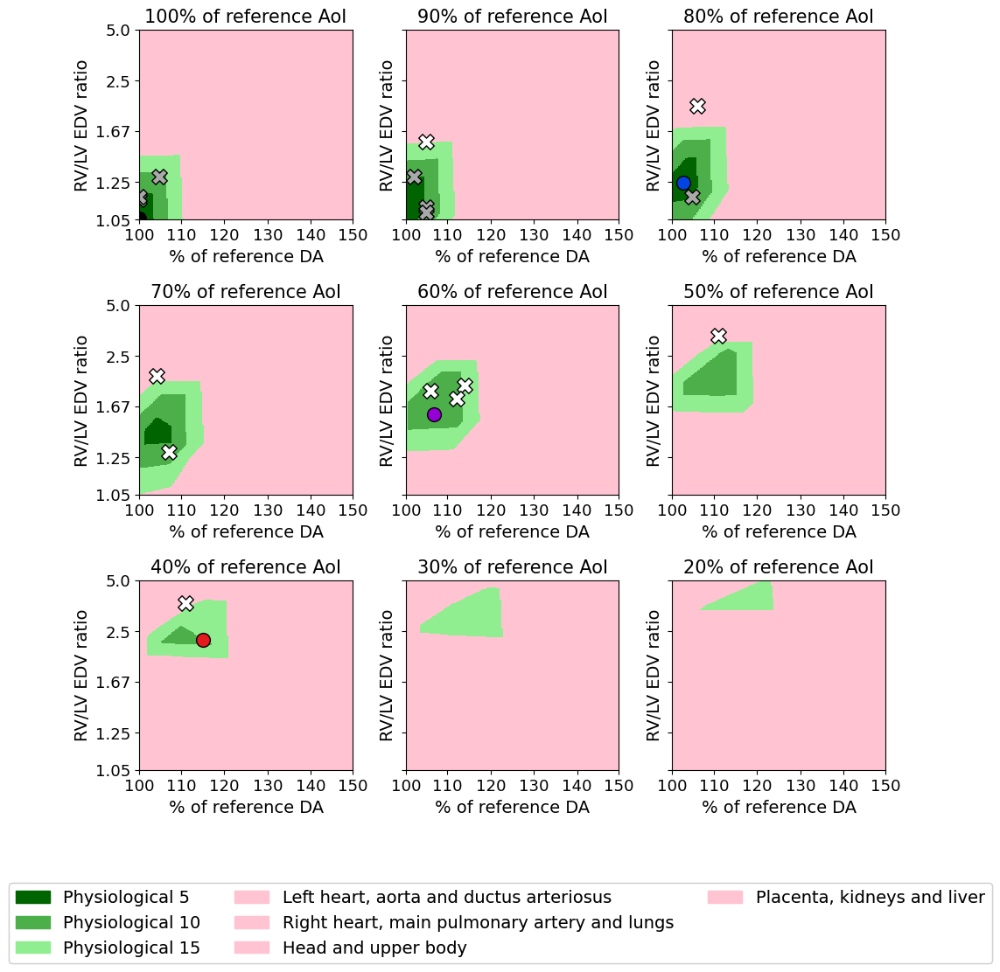

In [13]:
# ventricular depth also changes

possible_colors = ['darkgreen', '#4daf4a', 'lightgreen', '#ffc3d2', '#ffc3d2', '#ffc3d2', '#ffc3d2', 'w'] #['darkgreen', '#4daf4a', 'lightgreen', '#ff7f00', '#f781bf', '#17BECF', '#F0E442', 'w']
v_ist_plot = [1,0.9,0.8,0.7,0.6,0.5,0.4,0.3,0.2]

fig, axes = plt.subplots(3, 3, figsize=(11, 11), sharey=True)
axes = axes.flatten()

transposed_variation = [list(zip(*sublist)) for sublist in zip(*list_variation)]
transposed_matrix = [list(zip(*sublist)) for sublist in zip(*list_matrix)]
v_LV_positions = [np.argmin(np.abs(v_LV_interpolate - value)) for value in [0.95,0.8,0.6,0.4,0.2]]
v_da_positions = [np.argmin(np.abs(v_da_interpolate - value)) for value in np.linspace(1,1.5,6)]

cmap = mpl.colors.ListedColormap(possible_colors)
bounds = [-1, 0.9, 1.9, 2.9, 3.9, 4.9, 5.9, 6.9, 7.9] #bounds = [-1, 0.9, 1.9, 2.9, 3.9, 4.9, 5.9] 
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

ist_centroid = [1]
lv_centroid = [1]
edv_centroid = [0.945]
da_centroid = [1]
ist_curve = []
lv_curve = []
edv_curve = []
da_curve = []
ALL_COLOR_TOTAL = []

v_lv_interpolate = np.linspace(1, 0.35, 251)
v_colors = ['black', 'black', '#0343DF', 'darkviolet', '#e41a1c','k']

for i in range(len(v_ist_plot)):
    matrix = transposed_matrix[i] #i*2
    variation = transposed_variation[i] #i*2
    ax = axes[i]
    matrix2 = [list(zip(*sublist)) for sublist in zip(*matrix)]
    matrix2_array = np.array(matrix2)
    COLOR_TOTAL = np.transpose(np.maximum.reduce(matrix2_array))
    ALL_COLOR_TOTAL.append(COLOR_TOTAL)
    
    if i == 0 or i == 2 or i == 4 or i == 6:

        PHYSIOLOGIC = np.where((COLOR_TOTAL == 0) | (COLOR_TOTAL == 1), 1, 0)
        row_indices, col_indices = np.where(PHYSIOLOGIC == 1)
        centroid_row = np.mean(row_indices)
        centroid_col = np.mean(col_indices)

        variation2 = [list(zip(*sublist)) for sublist in zip(*variation)]
        variation2_array = np.array(variation2)
        VARIATION_TOTAL = np.transpose(np.sum(abs(variation2_array),0))
        PHYSIOLOGIC_VARIATION = VARIATION_TOTAL[row_indices, col_indices]

        if np.sum(PHYSIOLOGIC) > 0:
            ist_centroid.append(v_ist_plot[i])
            lv_centroid.append(np.round(v_lv_interpolate[int(centroid_row)],3))
            edv_centroid.append(np.round(v_LV_interpolate[int(centroid_row)],3))
            da_centroid.append(np.round(v_da_interpolate[int(centroid_col)],3))  

            min_index_physiologic = np.argmin(PHYSIOLOGIC_VARIATION)
            min_row = row_indices[min_index_physiologic]        
            min_col = col_indices[min_index_physiologic]

            ist_curve.append(v_ist_plot[i])
            lv_curve.append(np.round(v_lv_interpolate[int(min_row)],3))
            edv_curve.append(np.round(v_LV_interpolate[int(min_row)],3))
            da_curve.append(np.round(v_da_interpolate[int(min_col)],3)) 

            ax.scatter(min_col,min_row,s=130,marker='o',color=v_colors[int(i/2)+1], edgecolors='black')

    # Create the final matrix with the maximum values for each node
    ax.imshow(COLOR_TOTAL, cmap = cmap, norm = norm, origin='lower', aspect='auto')
    ax.set_yticks(v_LV_positions, np.round(np.asarray([1/0.95,1/0.8,1/0.6,1/0.4,1/0.2]),2), fontsize=13)
    ax.set_xticks(v_da_positions, np.round(np.linspace(1,1.5,6)*100).astype(int), fontsize=13)
    ax.set_ylim([min(v_LV_positions),max(v_LV_positions)])
    ax.set_xlim([min(v_da_positions),max(v_da_positions)])
    ax.set_xlabel('% of reference DA', fontsize=14)
    ax.set_ylabel('RV/LV EDV ratio', fontsize=14)
    ax.set_title(f'{int(v_ist_plot[i]*100)}% of reference AoI', fontsize=15)

    if i == 0:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1)),np.argmin(np.abs(v_LV_interpolate - 0.87)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0098
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1)),np.argmin(np.abs(v_LV_interpolate - 0.86)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0035
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.05)),np.argmin(np.abs(v_LV_interpolate - 0.78)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0023
    
    if i == 1:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.05)),np.argmin(np.abs(v_LV_interpolate - 0.64)),s=160,marker='X',color='w',edgecolors='k') #1650184: no curves
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.05)),np.argmin(np.abs(v_LV_interpolate - 0.9)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0094
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.05)),np.argmin(np.abs(v_LV_interpolate - 0.92)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0054
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.02)),np.argmin(np.abs(v_LV_interpolate - 0.78)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0070
        
    if i == 2:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.06)),np.argmin(np.abs(v_LV_interpolate - 0.5)),s=160,marker='X',color='w',edgecolors='k') #4971148
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.05)),np.argmin(np.abs(v_LV_interpolate - 0.86)),s=160,marker='X',color='darkgrey',edgecolors='k') #aor_0048

    if i == 3:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.07)),np.argmin(np.abs(v_LV_interpolate - 0.78)),s=160,marker='X',color='w',edgecolors='k') #4901869
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.04)),np.argmin(np.abs(v_LV_interpolate - 0.48)),s=160,marker='X',color='w',edgecolors='k') #1630041: no curves

    if i == 4:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.14)),np.argmin(np.abs(v_LV_interpolate - 0.52)),s=160,marker='X',color='w',edgecolors='k') #1655249 
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.06)),np.argmin(np.abs(v_LV_interpolate - 0.54)),s=160,marker='X',color='w',edgecolors='k') #4988758: no curves
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.12)),np.argmin(np.abs(v_LV_interpolate - 0.57)),s=160,marker='X',color='w',edgecolors='k') #70225327

    if i == 5:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.11)),np.argmin(np.abs(v_LV_interpolate - 0.32)),s=160,marker='X',color='w',edgecolors='k') #4889106: no curves

    if i == 6:
        ax.scatter(np.argmin(np.abs(v_da_interpolate - 1.11)),np.argmin(np.abs(v_LV_interpolate - 0.29)),s=160,marker='X',color='w',edgecolors='k') #1493417

        
plt.subplots_adjust(wspace=0.25,hspace=0.45)

legend_handles = []
for i in range(len(sorted_reference_label)):
    legend_handles.append(mpatches.Patch(color=possible_colors[i], label= sorted_reference_label[i]))
legend_colors = fig.legend(handles=legend_handles, loc="lower center", bbox_to_anchor=(0.5, -0.1), ncol=3, fontsize=14)
fig.add_artist(legend_colors)  

plt.savefig(f"./Plots/Total_scenarios_x_depth.svg", format='svg')

In [23]:
def create_2Dplot_contour_5(label, interpolation, healthy_values, title, v_ist, v_LV, v_da, v_LV_interpolate, v_da_interpolate, c_pos, c_neg, list_matrix, reference_label, reference_value, reference_ist):
    v_LV_positions = [np.argmin(np.abs(v_LV_interpolate - value)) for value in [0.95,0.8,0.6,0.4,0.2]]
    v_da_positions = [np.argmin(np.abs(v_da_interpolate - value)) for value in np.linspace(1,1.5,6)]
    
    v_ist_plot = [1,0.8,0.6,0.4,0.2]

    fig, axes = plt.subplots(1, len(v_ist_plot), figsize=(14, 3.5), sharey=True)
    list_matrix2 = []

    for i in range(len(v_ist_plot)):
        ax = axes[i]

        v_ist_value = v_ist[(np.abs(v_ist - v_ist_plot[i])).argmin()]
        index = np.where(v_ist == v_ist_value)[0][0]
        interpolation_100 = interpolation/healthy_values*100-100
        matrix = interpolation_100[index]

        ax.imshow(matrix, cmap='turbo', origin='lower', aspect='auto', vmin=-15, vmax=15, alpha = 1)
        CS = ax.contour(np.linspace(0,len(v_da_interpolate),len(v_da_interpolate)),np.linspace(0,len(v_LV_interpolate),len(v_LV_interpolate)), matrix, levels=[-15, -10, -5, 0, 5, 10, 15], colors = ('w','k','k','k','k','k','w')) 
        
        # Write values in contours
        closest_coordinates = []
        for line in CS.collections:
            if line.get_paths():
                x_value = line.get_paths()[0].get_extents().get_points().mean(axis=0)[0]
                coordinates_list = line.get_paths()[0].vertices
                index_closest_x = np.argmin(np.abs(coordinates_list[:, 0] - x_value))
                closest_coordinates.append(tuple(coordinates_list[index_closest_x]))
        if title == 'Blood flow' and label == 'umbilical artery' and i == 4: 
            print(closest_coordinates)
            ax.clabel(CS, inline=True, fontsize=10, manual=[(70.088405754174794, 40.21600000000001), (170.68, 142.27693146409064)])
        else:
            ax.clabel(CS, inline=True, fontsize=10, manual=closest_coordinates)

            
        # Put x,y labels
        ax.set_yticks(v_LV_positions, np.round(np.asarray([1/0.95,1/0.8,1/0.6,1/0.4,1/0.2]),2), fontsize=13)
        ax.set_xticks(v_da_positions, np.round(np.linspace(1,1.5,6)*100).astype(int), fontsize=13)
        ax.set_xlabel('% of reference DA', fontsize=14)
        ax.set_ylabel('RV/LV EDV ratio', fontsize=14)
        ax.set_ylim([min(v_LV_positions),max(v_LV_positions)])
        ax.set_xlim([min(v_da_positions),max(v_da_positions)])
        ax.set_title(f'{int(v_ist_plot[i]*100)}% of reference AoI', fontsize=15)
        
        # Convert matrix to colors
        matrix_2 = np.ones(np.shape(matrix))*100 
        matrix_2[matrix>=15] = c_pos
        matrix_2[matrix<=-15] = c_neg
        #matrix_2[(matrix > -10) & (matrix < 10)] = 0
        matrix_2[(matrix > -15) & (matrix < 15)] = 2
        matrix_2[(matrix >= -10) & (matrix <= 10)] = 1
        matrix_2[(matrix >= -5) & (matrix <= 5)] = 0
    
        list_matrix2.append(matrix_2)
        if any(matrix[matrix>=15]):
            reference_label.append(f'{title} at {label} > 115%')
            reference_value.append(c_pos)
            reference_ist.append(v_ist[i])
        if any(matrix[matrix<=-15]):
            reference_label.append(f'{title} at {label} < 85%')
            reference_value.append(c_neg)
            reference_ist.append(v_ist[i])           

    # Show the plot
    fig.suptitle(f'{title} at {label}', fontsize=16, y=0.96)
    plt.tight_layout()
    plt.savefig(f"./Plots/{title} at {label}.eps", format='eps')
    plt.show()
        
    list_matrix.append(list_matrix2)
    
    return list_matrix, reference_label, reference_value, reference_ist, c_pos, c_neg
  

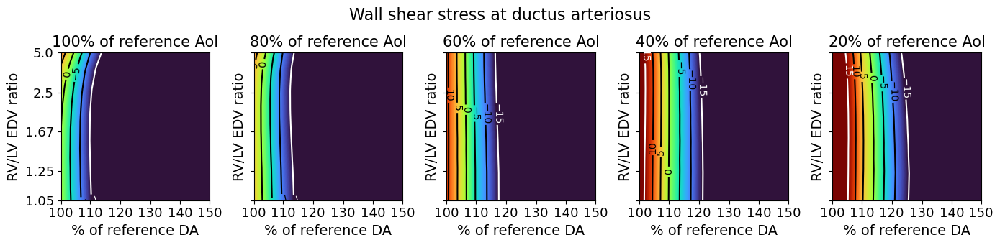

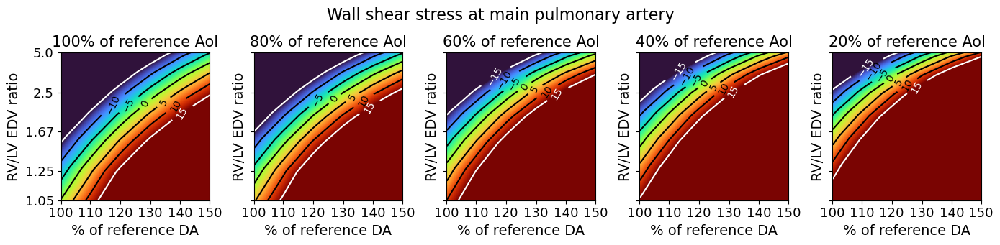

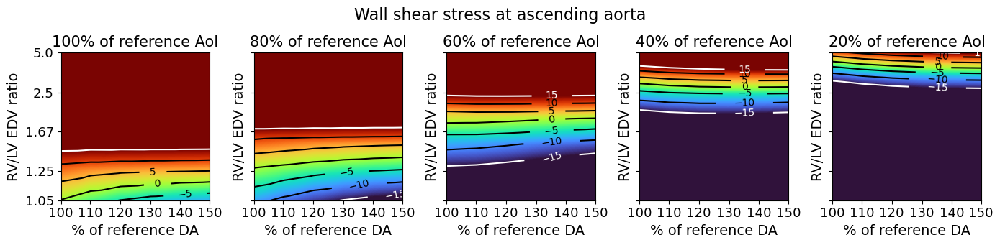

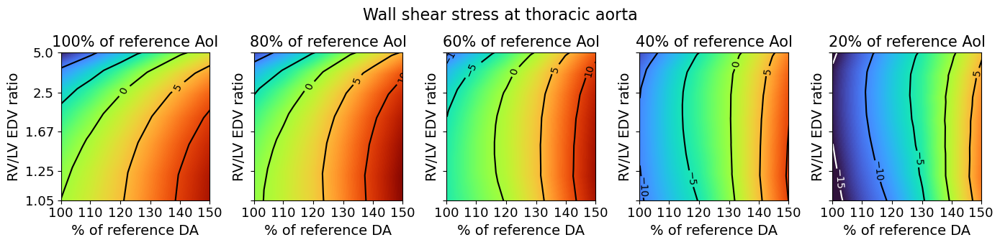

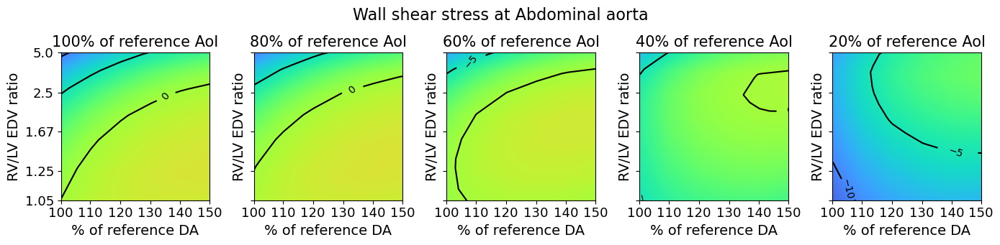

...

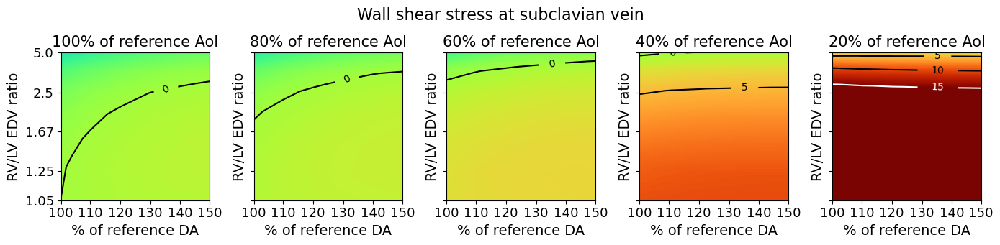

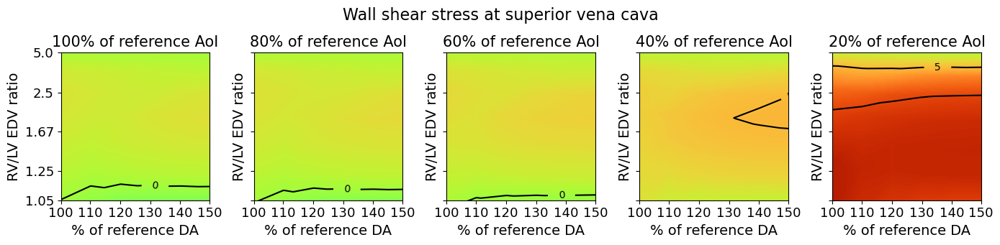

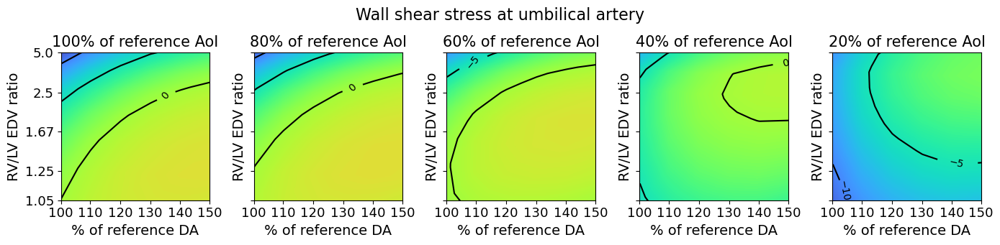

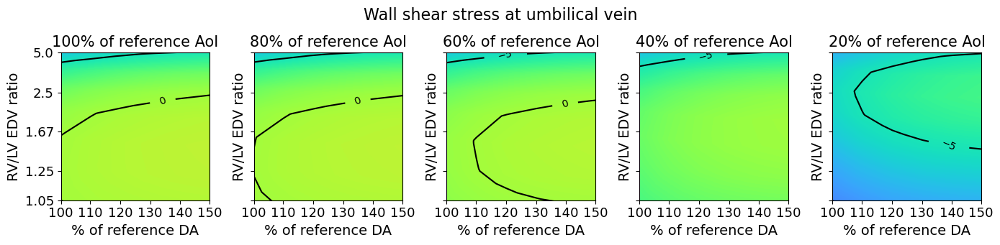

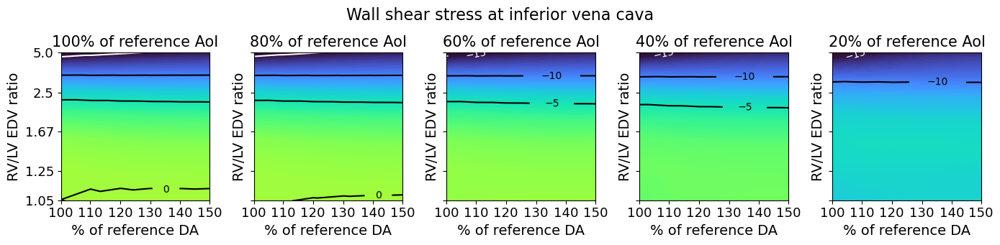

In [24]:
reference_label = []
reference_value = []
reference_ist = []
list_matrix = []

for i in range(len(INTERPOLATION_W)):
    c_pos = c_w[i]
    c_neg = c_w[i]
    list_matrix, reference_label, reference_value, reference_ist, c_pos, c_neg = create_2Dplot_contour_5(label_2[i], INTERPOLATION_W[i], healthy_values_W[i], 'Wall shear stress', v_ist, [0.95,0.9,0.8,0.7,0.6,0.5,0.4,0.3,0.2], v_da, v_LV_interpolate, v_da_interpolate, c_pos, c_neg, list_matrix, reference_label, reference_value, reference_ist)
    

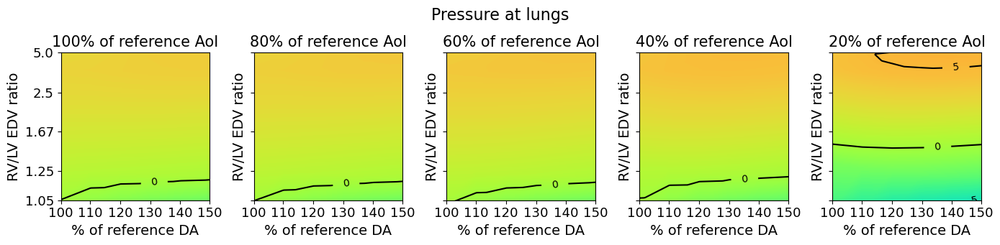

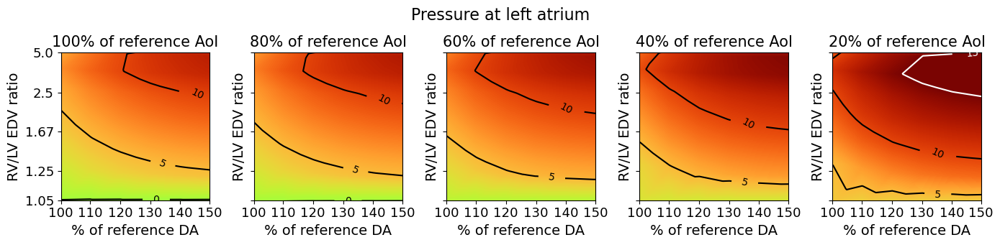

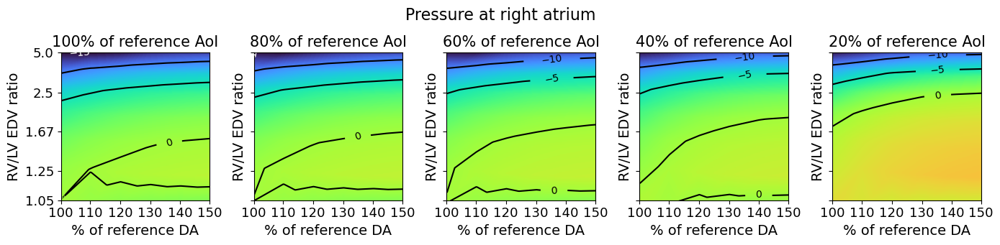

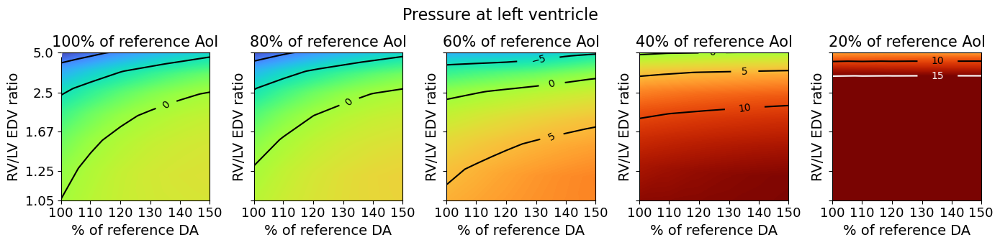

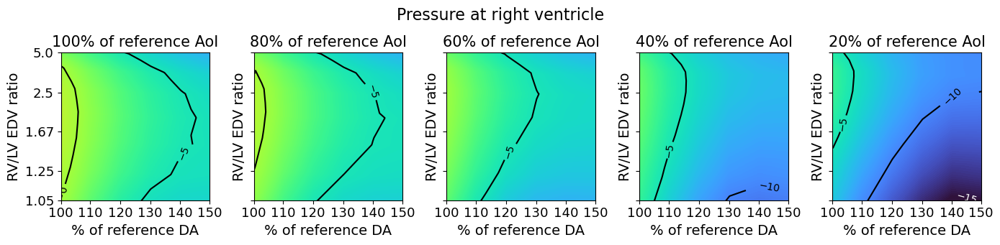

...

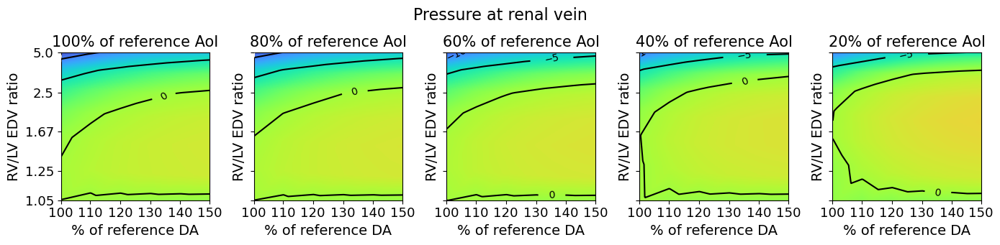

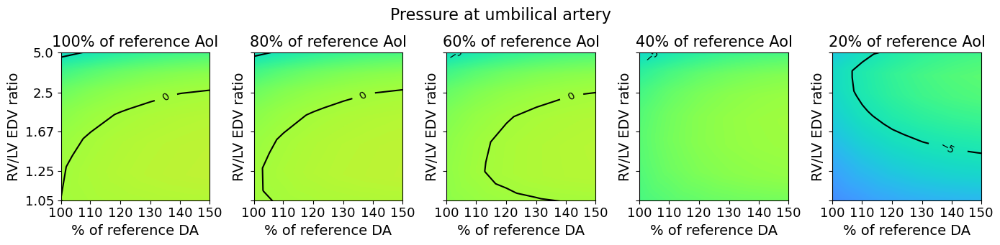

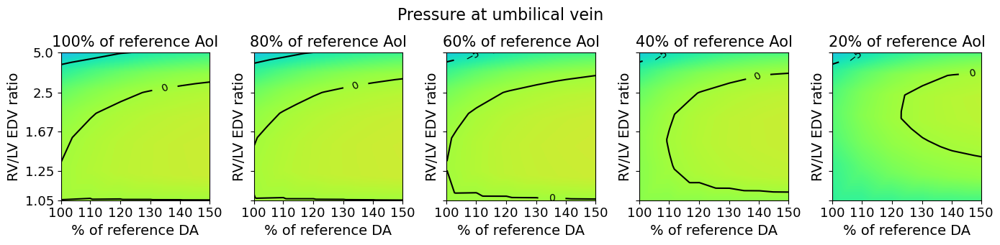

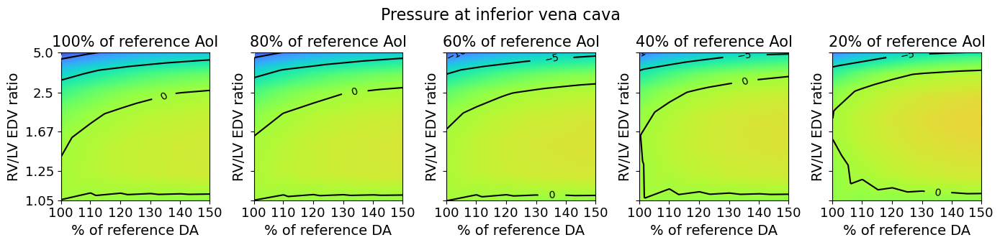

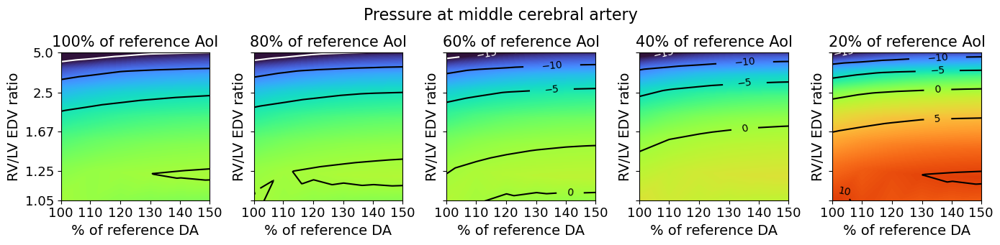

In [25]:
for i in range(len(INTERPOLATION_P)):
    c_pos = c_p[i]
    c_neg = c_p[i]
    list_matrix, reference_label, reference_value, reference_ist, c_pos, c_neg = create_2Dplot_contour_5(label[i], INTERPOLATION_P[i], healthy_values_P[i], 'Pressure', v_ist, [0.95,0.9,0.8,0.7,0.6,0.5,0.4,0.3,0.2], v_da, v_LV_interpolate, v_da_interpolate, c_pos, c_neg, list_matrix, reference_label, reference_value, reference_ist)


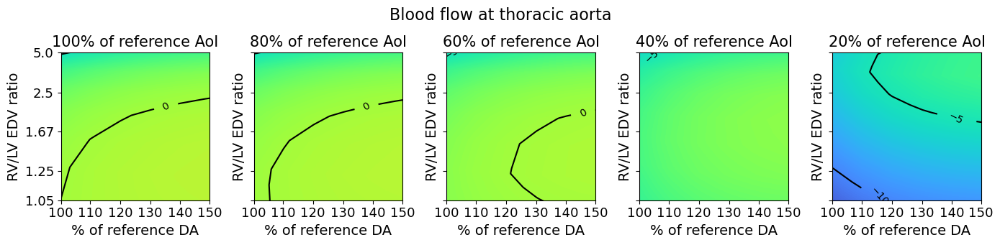

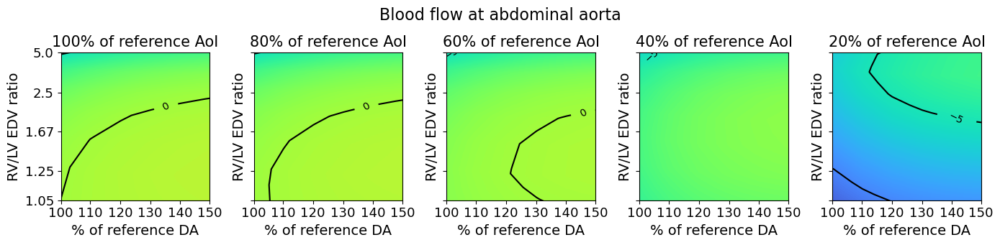

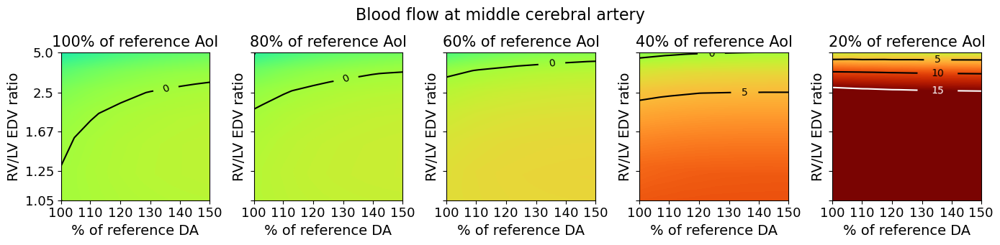

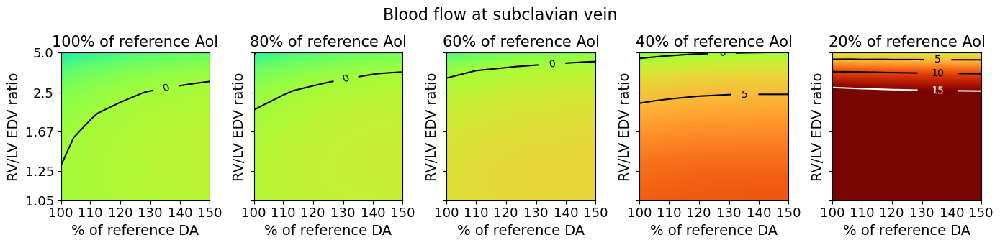

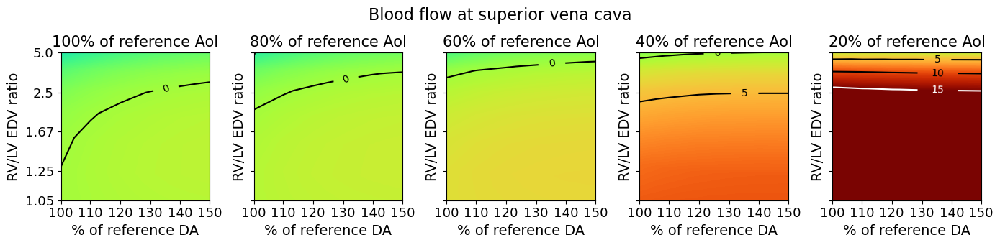

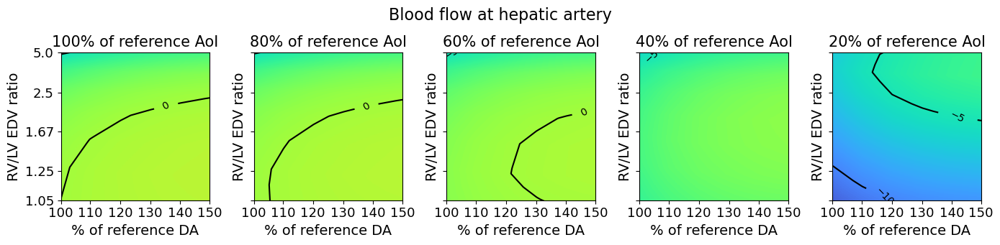

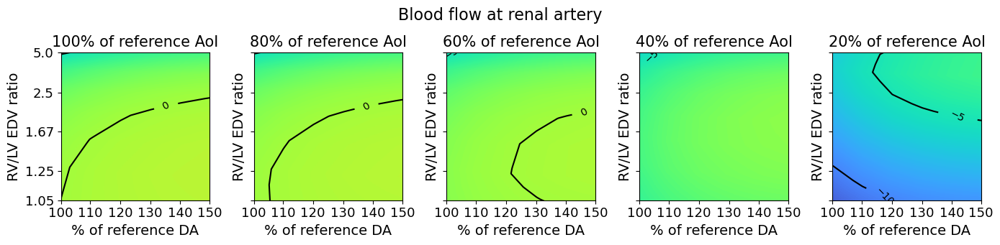

[(90.36, 22.146476944617746), (167.668, 140.92883440223915)]


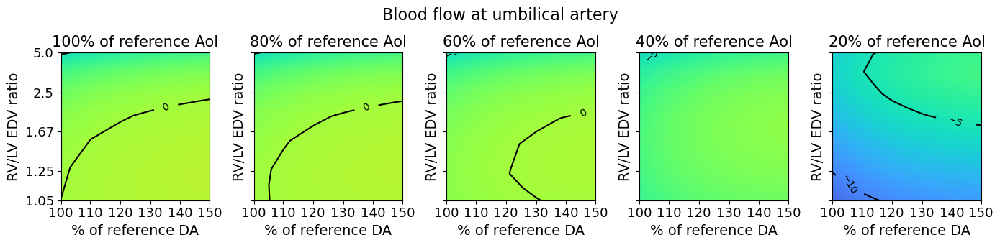

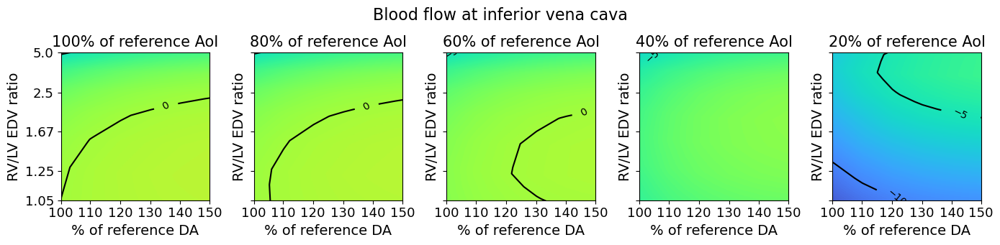

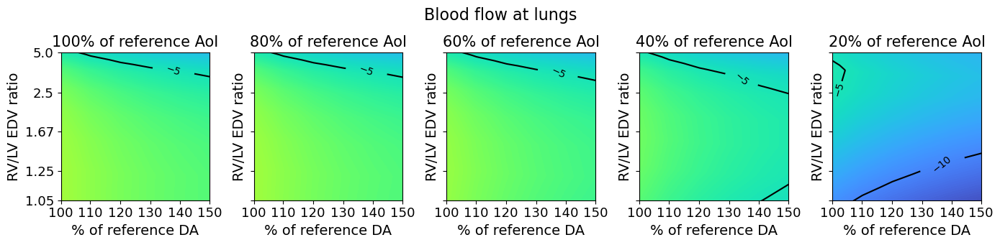

In [26]:
for i in range(len(INTERPOLATION_V)):
    c_pos = c_v[i]
    c_neg = c_v[i]
    list_matrix, reference_label, reference_value, reference_ist, c_pos, c_neg = create_2Dplot_contour_5(label_v[i], INTERPOLATION_V[i], healthy_values_V[i], 'Blood flow', v_ist, [0.95,0.9,0.8,0.7,0.6,0.5,0.4,0.3,0.2], v_da, v_LV_interpolate, v_da_interpolate, c_pos, c_neg, list_matrix, reference_label, reference_value, reference_ist)


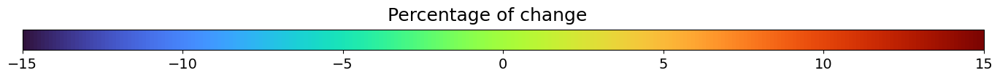

In [53]:
fig, ax = plt.subplots(figsize=(17, 0.75))
fig.subplots_adjust(bottom=0.5)

cmap = mpl.cm.turbo
norm = mpl.colors.Normalize(vmin=-15, vmax=+15)

cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap, norm=norm, orientation='horizontal')
ax.xaxis.set_tick_params(labelsize=14)
fig.suptitle('Percentage of change', fontsize=18, position=(0.5, 1.3))
plt.savefig(f"./Plots/Legend_imshow.svg", format='svg')


PI AoI 100% = 4.820000171661377
RI AoI 100% = 0.9200000166893005
mean AoI 100% = 15.0
diastolic AoI 100% = 6.0
PI AoI 80.0% = 4.28
RI AoI 80.0% = 0.92
mean AoI 80.0% = 21.0
diastolic AoI 80.0% = 8.0
PI AoI 60.0% = 3.35
RI AoI 60.0% = 0.9
mean AoI 60.0% = 31.0
diastolic AoI 60.0% = 11.0
PI AoI 40.0% = 2.76
RI AoI 40.0% = 0.89
mean AoI 40.0% = 40.0
diastolic AoI 40.0% = 14.0


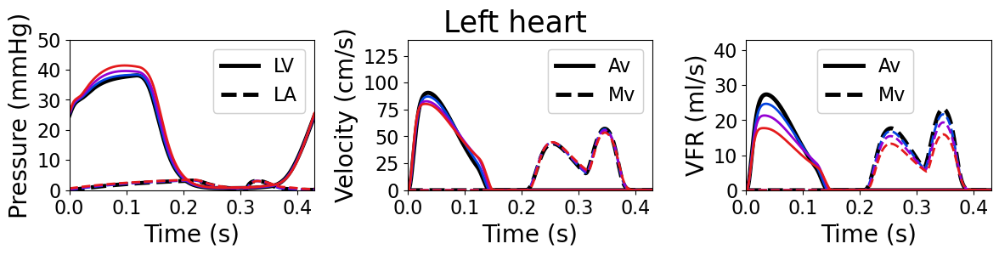

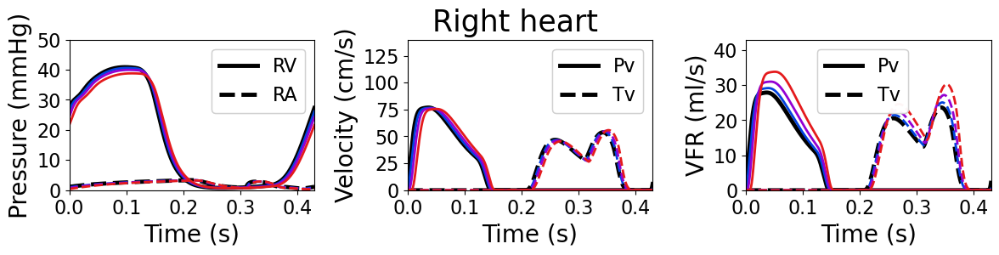

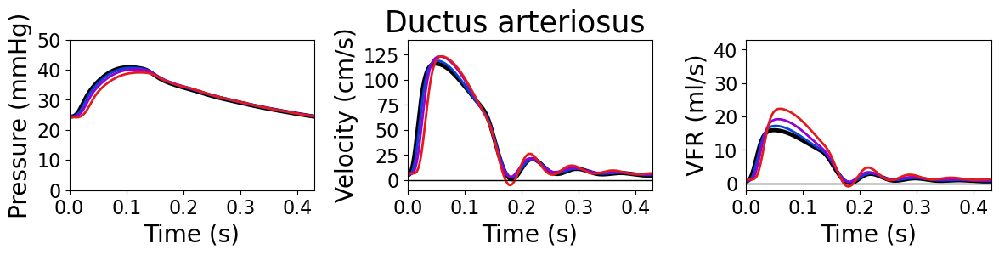

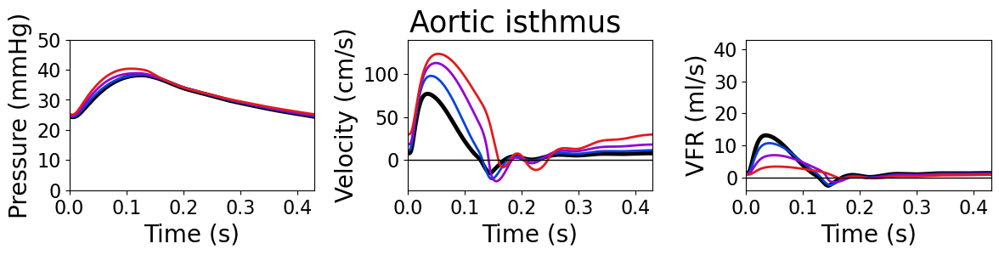

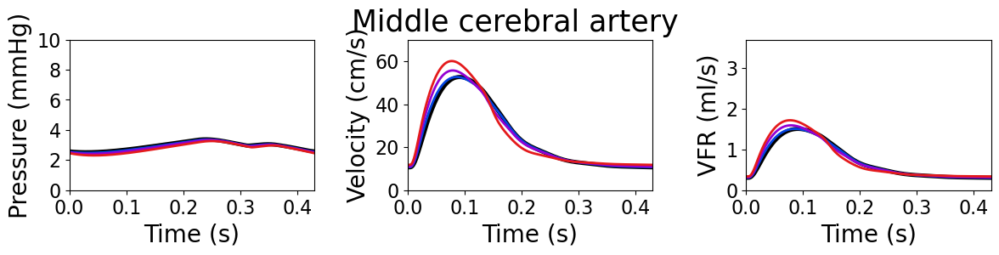

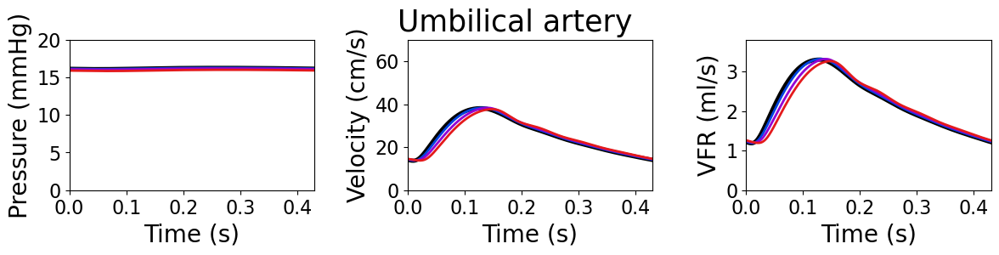

In [3]:
ist_curve = [1, 0.8, 0.6, 0.4] 
lv_curve = [1, 0.914, 0.791, 0.626] 
da_curve = [1, 1.027, 1.066, 1.149] 


v_colors = ['black', '#0343DF', 'darkviolet', '#e41a1c'] #v_colors = plt.cm.turbo(np.linspace(0,1,len(ist_curve)))
save_images = False

_, f = plt.subplots(ncols = 3, nrows = 1, figsize = (14, 2.3))
f = f.flatten()
_, f1 = plt.subplots(ncols = 3, nrows = 1, figsize = (14, 2.3))
f1 = f1.flatten()
_, f2 = plt.subplots(ncols = 3, nrows = 1, figsize = (14, 2.3))
f2 = f2.flatten()
_, f3 = plt.subplots(ncols = 3, nrows = 1, figsize = (14, 2.3))
f3 = f3.flatten()
_, f4 = plt.subplots(ncols = 3, nrows = 1, figsize = (14, 2.3))
f4 = f4.flatten()
_, f5 = plt.subplots(ncols = 3, nrows = 1, figsize = (14, 2.3))
f5 = f5.flatten()


healthy_r_isthm = 0.2329 
healthy_r_da = 0.2090 
healthy_r_aa = 0.2863121909147646
healthy_r_mpa = 0.3415
r_jv = 0.18755
r_ua = 0.165915 
r_mca = 0.135
r_uv = 0.345 
r_svc = 0.2 
r_ivc = 0.227 
r_tAo = 0.25955
r_aAo = 0.22
healthy_R_isthm = 0.011309325833881908
healthy_R_da = 0.045670902072876676
healthy_R_aa = 0.003315514090032661
healthy_R_mpa = 0.005649734476930556

for index in range(len(ist_curve)):
    data = np.load(f"Results_figure/IST{int(round(ist_curve[index]*100))}_LV{int(round(lv_curve[index]*100))}_DA{int(round(da_curve[index]*100))}.npz") #
    t = data['voi'] - np.min(data['voi']) 
    results = data['data']  
    names = data['names'] 
    constants = data['constants']
    names_constants = data['names_constants']
    color = v_colors[index]
    
    Aao = constants[np.where(np.all(names_constants == ('Parameters','Aao'), axis=1))[0][0]]
    Ami = constants[np.where(np.all(names_constants == ('Parameters','Ami'), axis=1))[0][0]]
    Apv = constants[np.where(np.all(names_constants == ('Parameters','Apv'), axis=1))[0][0]]
    Atr = constants[np.where(np.all(names_constants == ('Parameters','Atr'), axis=1))[0][0]]
    
    r_isthm = healthy_r_isthm*ist_curve[index]
    r_da = healthy_r_da*da_curve[index]
    
    degree_aa = (healthy_R_aa/constants[np.where(np.all(names_constants == ('Parameters','Raa'), axis=1))[0][0]])**(1/4)
    r_aa = healthy_r_aa*degree_aa
    
    degree_mpa = (healthy_R_mpa/constants[np.where(np.all(names_constants == ('Parameters','Rpa'), axis=1))[0][0]])**(1/4)
    r_mpa = healthy_r_mpa*degree_mpa
    
    DA = results[:,np.where(np.all(names == ('Bif_PAin_LUNG1out_DA2out', 'Qo2'), axis=1))[0][0]]
    ISTHMUS = results[:,np.where(np.all(names == ('AI_RCL', 'Qo'), axis=1))[0][0]]
    idx_0 = np.where(ISTHMUS<0.001)[0]
    first_zero = idx_0[0]
    last_zero = idx_0[-1]
    
    #print(f"Diastole/systole AoI {ist_curve[index]*100}% = {np.trapz(ISTHMUS[0:first_zero],t[0:first_zero])/np.trapz(ISTHMUS[last_zero:],t[last_zero:])}")
    #print(f"EDV = {np.max(results[:,np.where(np.all(names == ('LV','Vcav'), axis=1))[0][0]])/np.max(results[:,np.where(np.all(names == ('RV','Vcav'), axis=1))[0][0]])}")
    #print(f"SV_l/r = {100*np.trapz(results[:,np.where(np.all(names == ('LV','Qo'), axis=1))[0][0]],t)/2/(np.trapz(results[:,np.where(np.all(names == ('RV','Qo'), axis=1))[0][0]],t)/2)}")

    xi = results[:, np.where(np.all(names == ('LV', 'xi'), axis=1))[0][0]]
    Q_lv = results[:, np.where(np.all(names == ('LV', 'Qo'), axis=1))[0][0]]

    non_zero_indices = np.where(xi > 10**(-2))[0]
    first_non_zero_index = non_zero_indices[0]
    shifted_t = t[first_non_zero_index:] - t[first_non_zero_index]
    
    linewidth = 2
    if index == 0:
        linewidth = 3.5


    
    shifted_AoI = results[:,np.where(np.all(names == ('AI_RCL', 'Qo'), axis=1))[0][0]][first_non_zero_index:]/(np.pi*r_isthm**2)
    shifted_AoI_0 = np.maximum(shifted_AoI,0)
    diastole_AoI = shifted_AoI[np.argmin(np.abs(shifted_t - 0.28))]   
    print(f"PI AoI {ist_curve[index]*100}% = {np.round((np.max(shifted_AoI) - diastole_AoI)/np.mean(shifted_AoI_0),2)}")
    print(f"RI AoI {ist_curve[index]*100}% = {np.round((np.max(shifted_AoI) - diastole_AoI)/np.max(shifted_AoI),2)}")
    print(f"mean AoI {ist_curve[index]*100}% = {np.round(np.mean(shifted_AoI_0))}")
    print(f"diastolic AoI {ist_curve[index]*100}% = {np.round(np.mean(diastole_AoI))}")

    
    
    plt.sca(f[0])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('LV','Pi'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='-',label = 'LV',linewidth=linewidth)
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('LA','Pi'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='--',label = 'LA',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('Pressure (mmHg)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,50])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    if index == 0:
        legend = f[0].legend(loc = 'upper right', fontsize=16)
        f[0].add_artist(legend)
    
    plt.sca(f[1])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('LV','Qo'), axis=1))[0][0]][first_non_zero_index:]/Aao,color=color,linestyle='-',label = 'Av',linewidth=linewidth)
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('LA','Qo'), axis=1))[0][0]][first_non_zero_index:]/Ami,color=color,linestyle='--',label = 'Mv',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('Velocity (cm/s)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,140])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    if index == 0:
        legend = f[1].legend(loc = 'upper right', fontsize=16)
        f[1].add_artist(legend)

    plt.sca(f[2])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('LV','Qo'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='-',label = 'Av',linewidth=linewidth)
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('LA','Qo'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='--',label = 'Mv',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('VFR (ml/s)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,43])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    if index == 0:
        legend = f[2].legend(loc = 'upper right', fontsize=16, bbox_to_anchor=(0.72,1))
        f[2].add_artist(legend)
    
    if ist_curve[index] == ist_curve[-1]:
        plt.subplots_adjust(wspace=0.38)
        fig = plt.gcf()
        fig.suptitle('Left heart', fontsize=25, y=1.04)
    if save_images:
        plt.savefig(f"./Plots/Left_heart_curves.svg", format='svg')
    

    plt.sca(f1[0])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('RV','Pi'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='-',label = 'RV',linewidth=linewidth)
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('RA','Pi'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='--',label = 'RA',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('Pressure (mmHg)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,50])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    if index == 0:
        legend = f1[0].legend(loc = 'upper right', fontsize=16)
        f1[0].add_artist(legend)
    
    plt.sca(f1[1])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('RV','Qo'), axis=1))[0][0]][first_non_zero_index:]/Apv,color=color,linestyle='-',label = 'Pv',linewidth=linewidth)
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('RA','Qo'), axis=1))[0][0]][first_non_zero_index:]/Atr,color=color,linestyle='--',label = 'Tv',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('Velocity (cm/s)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,140])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    if index == 0:
        legend = f1[1].legend(loc = 'upper right', fontsize=16)
        f1[1].add_artist(legend)
    
    plt.sca(f1[2])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('RV','Qo'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='-',label = 'Pv',linewidth=linewidth)
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('RA','Qo'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='--',label = 'Tv',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('VFR (ml/s)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,43])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    if index == 0:
        legend = f1[2].legend(loc = 'upper right', fontsize=16, bbox_to_anchor=(0.7,1))
        f1[2].add_artist(legend)

    if ist_curve[index] == ist_curve[-1]:
        plt.subplots_adjust(wspace=0.38)
        fig = plt.gcf()
        fig.suptitle('Right heart', fontsize=25, y=1.04)
    if save_images:
        plt.savefig(f"./Plots/Right_heart_curves.svg", format='svg')


    plt.sca(f2[0])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('Bif_PAin_LUNG1out_DA2out', 'Pi'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='-',linewidth=linewidth) #('Bif_IVCin_FO1out_RA2out', 'Pi')
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('Pressure (mmHg)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,50])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    
    plt.sca(f2[1])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('Bif_PAin_LUNG1out_DA2out', 'Qo2'), axis=1))[0][0]][first_non_zero_index:]/(np.pi*r_da**2),color=color,linestyle='-',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('Velocity (cm/s)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([-10,140])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.axhline(y=0, color='k', linestyle='-', linewidth = 0.8)
    
    plt.sca(f2[2])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('Bif_PAin_LUNG1out_DA2out', 'Qo2'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='-',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('VFR (ml/s)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([-2,43])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.axhline(y=0, color='k', linestyle='-', linewidth = 0.8)

    if ist_curve[index] == ist_curve[-1]:
        plt.subplots_adjust(wspace=0.38)
        fig = plt.gcf()
        fig.suptitle('Ductus arteriosus', fontsize=25, y=1.04)
    if save_images:
        plt.savefig(f"./Plots/DA_curves.svg", format='svg')        
  
        
    plt.sca(f3[0])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('AI_RCL', 'Pi'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='-',linewidth=linewidth) #('Bif_IVCin_FO1out_RA2out', 'Pi')
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('Pressure (mmHg)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,50])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    
    plt.sca(f3[1])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('AI_RCL', 'Qo'), axis=1))[0][0]][first_non_zero_index:]/(np.pi*r_isthm**2),color=color,linestyle='-',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('Velocity (cm/s)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([-35,140])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.axhline(y=0, color='k', linestyle='-', linewidth = 0.8)
    
    plt.sca(f3[2])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('AI_RCL', 'Qo'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='-',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('VFR (ml/s)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([-4,43])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.axhline(y=0, color='k', linestyle='-', linewidth = 0.8)

    if ist_curve[index] == ist_curve[-1]:
        plt.subplots_adjust(wspace=0.38)
        fig = plt.gcf()
        fig.suptitle('Aortic isthmus', fontsize=25, y=1.04)
    if save_images:
        plt.savefig(f"./Plots/AI_curves.svg", format='svg') 
         

    GA = 32
    Tc = 0.43
    density = 1.05
    viscosity = (1.15+0.075*GA)/100
    Q_LICA = results[:,np.where(np.all(names == ('ICaroAL_RCL', 'Qo'), axis=1))[0][0]][first_non_zero_index:]
    Q_RICA = results[:,np.where(np.all(names == ('ICaroAR_RCL', 'Qo'), axis=1))[0][0]][first_non_zero_index:]
    Q_MCA = (Q_LICA + Q_RICA)*0.75*0.74312
    v_MCA = Q_MCA/(0.5*(np.pi*r_mca**2))    
    
    P_LICA = results[:,np.where(np.all(names == ('Bif_BRR1in_BRL2in_BRout', 'Pi2'), axis=1))[0][0]][first_non_zero_index:]
    P_RICA = results[:,np.where(np.all(names == ('Bif_BRR1in_BRL2in_BRout', 'Pi1'), axis=1))[0][0]][first_non_zero_index:] 
         
    plt.sca(f4[0])
    plt.plot(shifted_t,(P_LICA + P_RICA)/2,color=color,linestyle='-',linewidth=linewidth) #('Bif_IVCin_FO1out_RA2out', 'Pi')
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('Pressure (mmHg)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,10])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
        
    plt.sca(f4[1])
    plt.plot(shifted_t,v_MCA,color=color,linestyle='-',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('Velocity (cm/s)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,70])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
        
    plt.sca(f4[2])
    plt.plot(shifted_t,Q_MCA,color=color,linestyle='-',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('VFR (ml/s)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,3.7])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)

    if ist_curve[index] == ist_curve[-1]:
        plt.subplots_adjust(wspace=0.38)
        fig = plt.gcf()
        fig.suptitle('Middle cerebral artery', fontsize=25, y=1.04)
    if save_images:
        plt.savefig(f"./Plots/MCA_curves.svg", format='svg')            
 

    plt.sca(f5[0])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('PLAC_RC', 'Pi'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='-',linewidth=linewidth) #('Bif_IVCin_FO1out_RA2out', 'Pi')
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('Pressure (mmHg)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,20])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    
    plt.sca(f5[1])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('Bif_AOin_LEG1out_UA2out', 'Qo2'), axis=1))[0][0]][first_non_zero_index:]/(np.pi*r_ua**2),color=color,linestyle='-',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('Velocity (cm/s)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,70])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    
    plt.sca(f5[2])
    plt.plot(shifted_t,results[:,np.where(np.all(names == ('Bif_AOin_LEG1out_UA2out', 'Qo2'), axis=1))[0][0]][first_non_zero_index:],color=color,linestyle='-',linewidth=linewidth)
    plt.xlabel('Time (s)',fontsize=20)
    plt.ylabel('VFR (ml/s)',fontsize=20)
    plt.xlim([t[0],0.43])
    plt.ylim([0,3.8])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)

    if ist_curve[index] == ist_curve[-1]:
        plt.subplots_adjust(wspace=0.38)
        fig = plt.gcf()
        fig.suptitle('Umbilical artery', fontsize=25, y=1.04)
    if save_images:
        plt.savefig(f"./Plots/UA_curves.svg", format='svg')             
